In [1]:
%reload_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
import geopandas as gpd
import pathlib
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy
import plots
from shapely.geometry import box
from matplotlib import patheffects
from matplotlib.colors import TwoSlopeNorm, Normalize
from matplotlib.cm import ScalarMappable
from utils import createDuckCon, loadTrackingTable, loadSpatialTracking, mean_map_per_event
from dask.diagnostics import ProgressBar

ProgressBar().register()

In [2]:
# Config dataset names
gsmap_name = "GSMaP-MKV v8"
imerg_name = "IMERG Final V07"

# Set path for the tracking table files
gsmap_trackingtable = '/mnt/data/tracks/gsmap_v8_2015-2024/01mmhr_v8/track/grouped/*.parquet'
imerg_trackingtable = '/mnt/data/tracks/imerg_final_v7_2015-2024/01mmhr_v7/track/grouped/*.parquet'

# Set paths for the netcdfs files
gsmap_netcdf_path = '/mnt/data/tracks/gsmap_v8_2015-2024/01mmhr_v8/spatial/'
imerg_netcdf_path = '/mnt/data/tracks/imerg_final_v7_2015-2024/01mmhr_v7/spatial/'

In [3]:
# Create DuckDB connection
con = createDuckCon("/tmp/propagation.duckdb")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [4]:
# Load tracking tables into DuckDB
loadTrackingTable(con, gsmap_trackingtable, 'gsmap_tracking')
loadTrackingTable(con, imerg_trackingtable, 'imerg_tracking')

In [8]:
# Load spatial tracking data
gsmap_ds_v8 = loadSpatialTracking(gsmap_netcdf_path)
imerg_ds_v7 = loadSpatialTracking(imerg_netcdf_path)

Loading spatial tracking data from: /mnt/data/tracks/gsmap_v8_2015-2024/01mmhr_v8/spatial/
Loading spatial tracking data from: /mnt/data/tracks/imerg_final_v7_2015-2024/01mmhr_v7/spatial/


##### 5.14 Spatial distribution of the False Alarm Ratio (FAR) for GSMaP (left) and IMERG (right). (a and b) FAR with automatic selection of correction methods. (c and d) FAR without any correction. (e and f) Skill Score representing the improvement achieved by the automatic selection relative to the baseline.

In [6]:
gsmap_clu_count = gsmap_ds_v8['clu-density'].sum(dim='time', skipna=True).compute()
imerg_clu_count = imerg_ds_v7['clu-density'].sum(dim='time', skipna=True).compute()

[                                        ] | 0% Completed | 257.02 us

[########################################] | 100% Completed | 4.76 sms
[########################################] | 100% Completed | 4.51 sms


In [7]:
gsmap_clust_far_correction = gsmap_ds_v8['clu-far'].sum(dim='time', skipna=True).compute() / gsmap_clu_count
imerg_clust_far_correction = imerg_ds_v7['clu-far'].sum(dim='time', skipna=True).compute() / imerg_clu_count

gsmap_clust_far_no_correction = gsmap_ds_v8['clu-far_'].sum(dim='time', skipna=True).compute() / gsmap_clu_count
imerg_clust_far_no_correction = imerg_ds_v7['clu-far_'].sum(dim='time', skipna=True).compute() / imerg_clu_count

[########################################] | 100% Completed | 9.71 sms
[########################################] | 100% Completed | 20.74 s
[########################################] | 100% Completed | 16.59 s
[########################################] | 100% Completed | 20.93 s


In [8]:
# Calculate skill score for gsmap
gsmap_clust_far_skill_score = (gsmap_clust_far_correction - gsmap_clust_far_no_correction) / (0 - gsmap_clust_far_no_correction) * 100
imerg_clust_far_skill_score = (imerg_clust_far_correction - imerg_clust_far_no_correction) / (0 - imerg_clust_far_no_correction) * 100

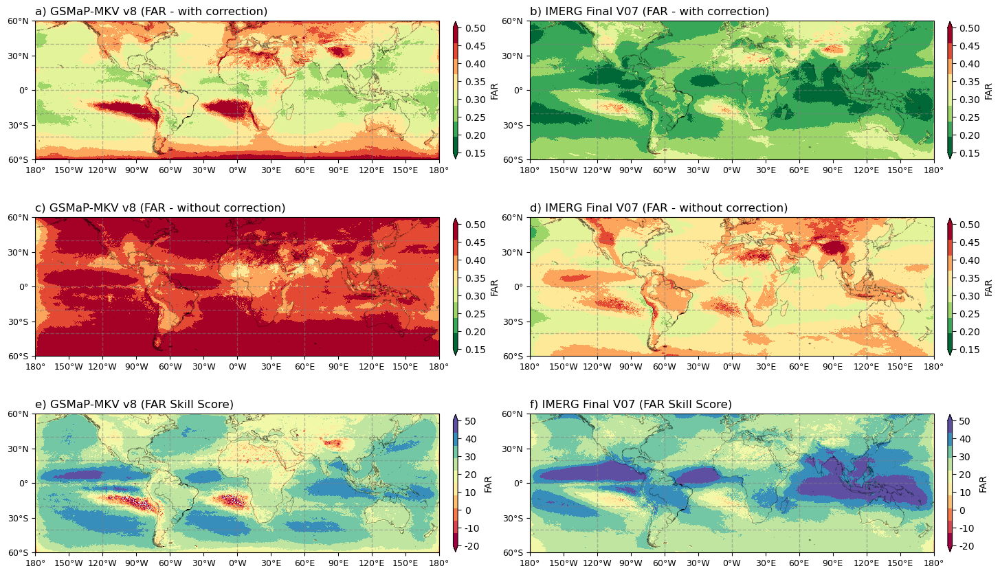

In [9]:
# Figure that shows the scores
fig, axes = plt.subplots(3, 2, figsize=(18, 26), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': -0.8, 'wspace': 0.065})
plots.map(gsmap_clust_far_correction, figsize=(12, 12), ax=axes[0,0], title='', ylim=[-60, 60], cmap_num=8, cmap='RdYlGn_r',
          cbar_fraction=0.1,  cbar_shrink=0.14, max_val=0.5, min_val=0.15, cbar_extend='both', cbar_format='%.2f',cbar_label='FAR')
plots.map(imerg_clust_far_correction, figsize=(12, 12), ax=axes[0,1], title='', ylim=[-60, 60], cmap_num=8, cmap='RdYlGn_r',
          cbar_fraction=0.1,  cbar_shrink=0.14, max_val=.5, min_val=0.15, cbar_extend='both', cbar_format='%.2f',cbar_label='FAR')
plots.map(gsmap_clust_far_no_correction, figsize=(12, 12), ax=axes[1,0], title='', ylim=[-60, 60], cmap_num=8, cmap='RdYlGn_r',
          cbar_fraction=0.1,  cbar_shrink=0.14, max_val=.5, min_val=0.15, cbar_extend='both', cbar_format='%.2f',cbar_label='FAR')
plots.map(imerg_clust_far_no_correction, figsize=(12, 12), ax=axes[1,1], title='', ylim=[-60, 60], cmap_num=8, cmap='RdYlGn_r',
          cbar_fraction=0.1,  cbar_shrink=0.14, max_val=.5, min_val=0.15, cbar_extend='both', cbar_format='%.2f',cbar_label='FAR')
plots.map(gsmap_clust_far_skill_score, figsize=(12, 12), ax=axes[2,0], title='', ylim=[-60, 60], cmap_num=10, cmap='Spectral',
          cbar_fraction=0.1,  cbar_shrink=0.14, max_val=50, min_val=-20, cbar_extend='both', cbar_label='FAR')
plots.map(imerg_clust_far_skill_score, figsize=(12, 12), ax=axes[2,1], title='', ylim=[-60, 60], cmap_num=10, cmap='Spectral',
          cbar_fraction=0.1,  cbar_shrink=0.14, max_val=50, min_val=-20, cbar_extend='both', cbar_label='FAR')
axes[0,0].set_title(f'a) {gsmap_name} (FAR - with correction)', loc='left', y=1)
axes[0,1].set_title(f'b) {imerg_name} (FAR - with correction)', loc='left', y=1)
axes[1,0].set_title(f'c) {gsmap_name} (FAR - without correction)', loc='left', y=1)
axes[1,1].set_title(f'd) {imerg_name} (FAR - without correction)', loc='left', y=1)
axes[2,0].set_title(f'e) {gsmap_name} (FAR Skill Score)', loc='left', y=1)
axes[2,1].set_title(f'f) {imerg_name} (FAR Skill Score)', loc='left', y=1);

#### Table 5.2 - Quantification of tracking status occurrences for GSMaP and IMERG products during the 2015-2024 period

In [ ]:
# Create a query to count number of occurrences of sttatus types at entire data, use column 'status' and count number of occurrences of each types
status_counts_gsmap = con.execute(f"""SELECT 
                                    status,
                                    COUNT(*) AS qtd
                                FROM gsmap_tracking
                                GROUP BY status
                                ORDER BY qtd DESC;
                                """).df()
                                  
status_counts_imerg = con.execute(f"""SELECT 
                                    status,
                                    COUNT(*) AS qtd
                                FROM imerg_tracking
                                GROUP BY status
                                ORDER BY qtd DESC;
                                """).df()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [12]:
# Merge both dataframes on 'status' column, using left join
status_counts = pd.merge(status_counts_gsmap, status_counts_imerg, on='status', how='outer', suffixes=('_gsmap', '_imerg')).fillna(0)
status_counts['qtd_gsmap'] = status_counts['qtd_gsmap'].astype(int)
status_counts['qtd_imerg'] = status_counts['qtd_imerg'].astype(int)
status_counts = status_counts.sort_values(by='qtd_gsmap', ascending=False)
# Calculate percentage of each status type in relation to total number of occurrences
total_gsmap = status_counts['qtd_gsmap'].sum()
total_imerg = status_counts['qtd_imerg'].sum()
status_counts['percent_gsmap'] = (status_counts['qtd_gsmap'] / total_gsmap * 100).round(2)
status_counts['percent_imerg'] = (status_counts['qtd_imerg'] / total_imerg * 100).round(2)
status_counts

,status,qtd_gsmap,qtd_imerg,percent_gsmap,percent_imerg
0,CON,38173855,178029630,63.87,75.32
3,NEW,9861853,19862433,16.50,8.40
1,MRG,7189581,21167947,12.03,8.96
5,SPL,2201901,9725880,3.68,4.11
2,MRG/SPL,1314431,4101835,2.20,1.74
4,NEW/SPL,1022977,3469825,1.71,1.47


##### Figure 5.15 - Boxplots comparing the characteristics distinct dinamic interactions of PSs classified as "Continuous" and "Non-continuous" over Land (upper panels) and Ocean (lower panels) for both GSMaP and IMERG datasets. The characteristics analyzed are: (a and d) Duration (hours), (b and e) Average Size (km2), and (c and f) Average Mean Precipitation (mm/h).

In [13]:
query = """
SELECT
    uid,
    CASE
        WHEN COUNT(*) FILTER (WHERE status = 'NEW') = 1
         AND COUNT(*) FILTER (WHERE status NOT IN ('NEW', 'CON')) = 0
        THEN 'Continuous'
        ELSE 'Non-Continuous'
    END AS classification,
    CASE
        WHEN ANY_VALUE(region) ILIKE '%Ocean%' OR ANY_VALUE(region) ILIKE '%Sea%' THEN 'Ocean'
        ELSE 'Land'
    END AS region_type,
    MAX(duration) / 60 AS max_duration,
    AVG(size) / (0.1 * 0.1) AS avg_size,
    AVG(mean) AS avg_mean_precipitation
FROM
    gsmap_tracking
GROUP BY
    uid
ORDER BY
    uid;
"""

gsmap_classification = con.execute(query).df()
imerg_classification = con.execute(query.replace('gsmap_tracking', 'imerg_tracking')).df()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [14]:
# number of occurrences of each classification type and region type
gsmap_classification_counts = gsmap_classification.groupby(['classification', 'region_type']).size().reset_index(name='count')
imerg_classification_counts = imerg_classification.groupby(['classification', 'region_type']).size().reset_index(name='count')
print("GSMaP Classification Counts:")
print(gsmap_classification_counts)
print("IMERG Classification Counts:")
print(imerg_classification_counts)

GSMaP Classification Counts:
   classification region_type    count
0      Continuous        Land  2549767
1      Continuous       Ocean  4042240
2  Non-Continuous        Land  1480345
3  Non-Continuous       Ocean  2663792
IMERG Classification Counts:
   classification region_type    count
0      Continuous        Land  3772184
1      Continuous       Ocean  8338672
2  Non-Continuous        Land  3631593
3  Non-Continuous       Ocean  7250758


In [ ]:
gsmap_classification["dataset"] = "GSMaP"
imerg_classification["dataset"] = "IMERG"
df = pd.concat([gsmap_classification, imerg_classification], ignore_index=True)

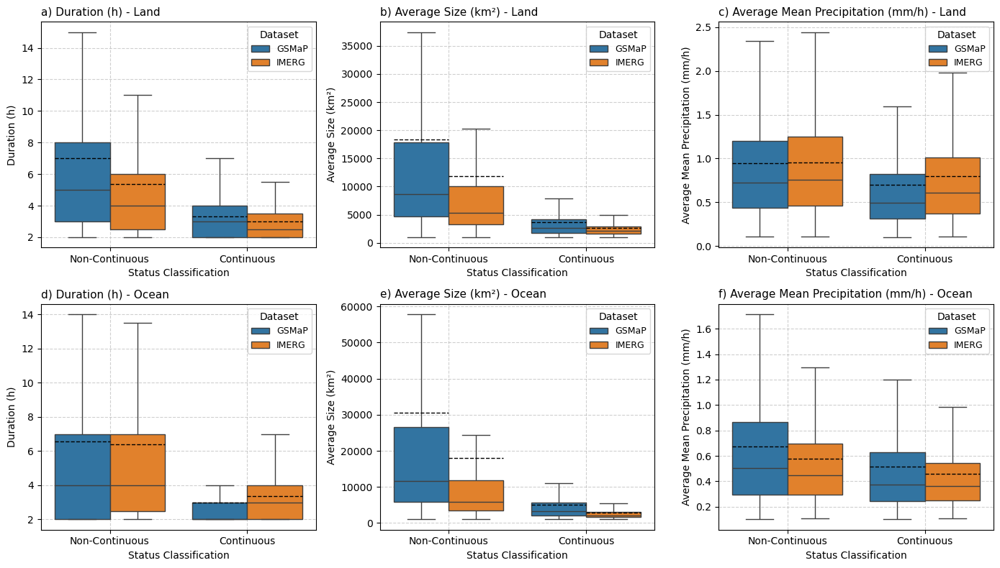

In [16]:
variables = ["max_duration", "avg_size", "avg_mean_precipitation"]
regions = ["Land", "Ocean"]
labels = {
    "max_duration": "Duration (h)",
    "avg_size": "Average Size (km²)",
    "avg_mean_precipitation": "Average Mean Precipitation (mm/h)"
}
import string
fig, axes = plt.subplots(2, len(variables), figsize=(14, 8), sharey=False)
letters = list(string.ascii_lowercase)
for row, region in enumerate(regions):
    for col, var in enumerate(variables):
        ax = axes[row, col]
        sns.boxplot(
            data=df[df["region_type"] == region],
            x="classification",
            y=var,
            hue="dataset",
            ax=ax,
            showfliers=False,
            meanline=True, showmeans=True, meanprops={"color": "black", "ls": "--", "lw": 1},
            palette={"GSMaP": "#1f77b4", "IMERG": "#ff7f0e"}
        )
        subplot_idx = row * len(variables) + col
        letter = letters[subplot_idx]
        ax.set_title(f"{letter}) {labels[var]} - {region}",
                     fontsize=11, loc="left")
        ax.set_xlabel("Status Classification")
        ax.set_ylabel(labels[var])
        ax.grid(True, linestyle="--", alpha=0.6)
        ax.legend(title="Dataset", loc="upper right", fontsize=9)
plt.tight_layout()
plt.show()

##### Figure 5.16 - Cumulative distribution functions of the FAR for GSMaP (left) and IMERG (right), stratified by event class (Continuous vs. Non-continuous) and surface type (Land vs. Ocean)

In [18]:
def method_classification(con, table_name, out_dir="queries/method_classification/", filename=None, force=False):
    out_dir = pathlib.Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)
    if filename is None:
        filename = f"{table_name}_method_classification.parquet"
    out_path = out_dir / filename
    if out_path.exists() and not force:
        return pd.read_parquet(out_path)
    query = f"""
    WITH event_classification AS (
        SELECT
            uid,
            CASE
                WHEN COUNT(*) FILTER (WHERE status = 'NEW') = 1
                 AND COUNT(*) FILTER (WHERE status NOT IN ('NEW', 'CON')) = 0
                THEN 'Continuous'
                ELSE 'Non-Continuous'
            END AS classification,
            CASE
                WHEN ANY_VALUE(region) ILIKE '%Ocean%' OR ANY_VALUE(region) ILIKE '%Sea%' THEN 'Ocean'
                ELSE 'Land'
            END AS region_type
        FROM
            {table_name}
        GROUP BY
            uid
    )
    SELECT
        g.method,
        e.classification,
        e.region_type,
        g.far_
    FROM
        {table_name} AS g
    JOIN
        event_classification AS e
    ON
        g.uid = e.uid
    """
    con.execute(f"COPY ({query}) TO '{out_path.as_posix()}' (FORMAT PARQUET);")
    return pd.read_parquet(out_path)

In [19]:
gsmap_method_classification = method_classification(con, "gsmap_tracking")
imerg_method_classification = method_classification(con, "imerg_tracking")

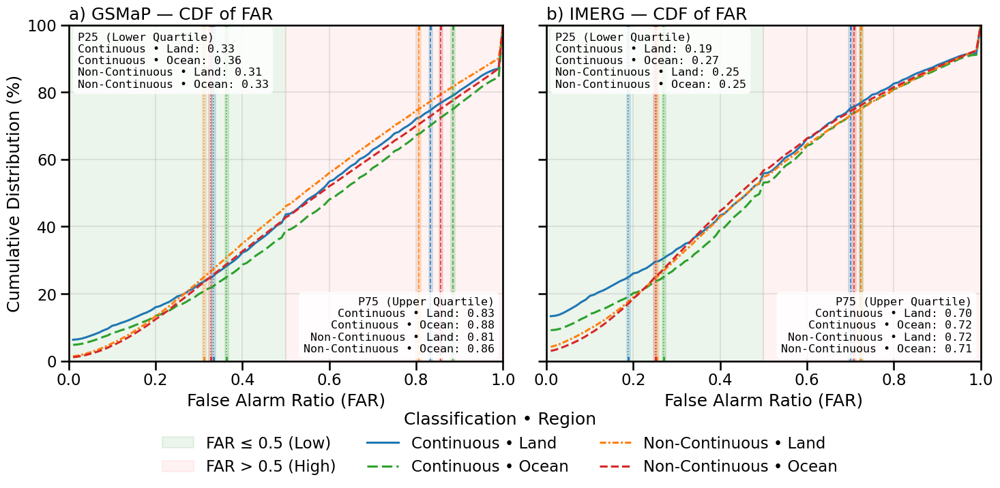

In [20]:
def _sanitize(df):
    out = df[['classification', 'region_type', 'far_']].dropna(subset=['far_']).copy()
    out['far_'] = out['far_'].clip(0, 1)
    return out
def aggregate_cdf(df, bins=np.linspace(0, 1, 101)):
    df = _sanitize(df)
    df['bin'] = pd.cut(df['far_'], bins=bins, include_lowest=True)
    counts = (
        df.groupby(['classification', 'region_type', 'bin'], observed=True)['far_']
          .size()
          .rename('count')
          .reset_index()
    )
    totals = counts.groupby(['classification', 'region_type'], observed=True)['count'].transform('sum')
    counts['pct'] = counts['count'] / totals * 100
    right_edges = counts['bin'].cat.categories.right
    counts['x'] = counts['bin'].map(dict(zip(counts['bin'].cat.categories, right_edges)))
    counts = counts.sort_values(['classification', 'region_type', 'x'])
    counts['cdf_pct'] = counts.groupby(['classification', 'region_type'], observed=True)['pct'].cumsum()
    counts['label'] = counts['classification'] + ' • ' + counts['region_type']
    return counts
def summarize_stats(df):
    df = _sanitize(df)
    stats = (
        df.groupby(['classification', 'region_type'], observed=True)['far_']
          .agg(['mean',
                lambda x: np.nanpercentile(x, 25),
                lambda x: np.nanpercentile(x, 75)])
          .rename(columns={'<lambda_0>': 'p25', '<lambda_1>': 'p75'})
          .reset_index()
    )
    stats['label'] = stats['classification'] + ' • ' + stats['region_type']
    return stats
bins = np.linspace(0, 1, 101)
gsmap_cdf = aggregate_cdf(gsmap_method_classification, bins)
imerg_cdf = aggregate_cdf(imerg_method_classification, bins)
gsmap_stats = summarize_stats(gsmap_method_classification)
imerg_stats = summarize_stats(imerg_method_classification)
palette = {
    'Continuous • Land': '#1f77b4',
    'Continuous • Ocean': '#2ca02c',
    'Non-Continuous • Land': '#ff7f0e',
    'Non-Continuous • Ocean': '#d62728',
}
linestyles = {
    'Continuous • Land': 'solid',
    'Continuous • Ocean': (0, (5, 2)),
    'Non-Continuous • Land': (0, (3, 1, 1, 1)),
    'Non-Continuous • Ocean': 'dashed'
}
sns.set_context("talk")
fig, axes = plt.subplots(1, 2, figsize=(15, 7), sharey=True)
for ax, data, stats, title in [
    (axes[0], gsmap_cdf, gsmap_stats, "a) GSMaP — CDF of FAR"),
    (axes[1], imerg_cdf, imerg_stats, "b) IMERG — CDF of FAR")
]:
    ax.axvspan(0.0, 0.5, color='green', alpha=0.08, label='FAR ≤ 0.5 (Low)')
    ax.axvspan(0.5, 1.0, color='red', alpha=0.05, label='FAR > 0.5 (High)')
    for lbl, style in linestyles.items():
        subset = data[data['label'] == lbl]
        ax.plot(subset['x'], subset['cdf_pct'],
                label=lbl, color=palette[lbl], linestyle=style, linewidth=2.2)
        s = stats[stats['label'] == lbl].iloc[0]
        ax.axvspan(s['p25'] - 0.004, s['p25'] + 0.004, color=palette[lbl], alpha=0.15)
        ax.axvspan(s['p75'] - 0.004, s['p75'] + 0.004, color=palette[lbl], alpha=0.15)
        ax.axvline(s['p25'], color=palette[lbl], linestyle=':', linewidth=1.2, alpha=0.9)
        ax.axvline(s['p75'], color=palette[lbl], linestyle='--', linewidth=1.2, alpha=0.9)
        ax.plot(s['p25'], 0, marker='|', color=palette[lbl], markersize=10, markeredgewidth=2)
        ax.plot(s['p75'], 100, marker='|', color=palette[lbl], markersize=10, markeredgewidth=2)
    box_text_p25 = "\n".join([
        f"{r['label']}: {r['p25']:.2f}" for _, r in stats.iterrows()
    ])
    box_text_p75 = "\n".join([
        f"{r['label']}: {r['p75']:.2f}" for _, r in stats.iterrows()
    ])
    ax.text(0.02, 0.98, f"P25 (Lower Quartile)\n{box_text_p25}",
            transform=ax.transAxes, ha='left', va='top',
            fontsize=12, family='monospace',
            bbox=dict(boxstyle="round,pad=0.4", facecolor='white', alpha=0.85, edgecolor='none'))

    ax.text(0.98, 0.02, f"P75 (Upper Quartile)\n{box_text_p75}",
            transform=ax.transAxes, ha='right', va='bottom',
            fontsize=12, family='monospace',
            bbox=dict(boxstyle="round,pad=0.4", facecolor='white', alpha=0.85, edgecolor='none'))
    ax.set_title(title, fontsize=18, loc='left')
    ax.set_xlabel("False Alarm Ratio (FAR)")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3)
    if ax == axes[0]:
        ax.set_ylabel("Cumulative Distribution (%)")
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3,
           bbox_to_anchor=(0.5, -0.05), frameon=False,
           title="Classification • Region")
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.show()

#####  Table 5.3 - Quantification of displacement vector correction method occurrences selected by the automatic mode for GSMaP and IMERG products during the 2015-2024 period.

In [5]:
query = f"""
    SELECT
            method,
            COUNT(*) AS qtd_usado,
        FROM gsmap_tracking
        GROUP BY method
        ORDER BY qtd_usado DESC;
"""
method_gsmap = con.execute(query).df()
method_imerg = con.execute(query.replace('gsmap_tracking', 'imerg_tracking')).df()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [6]:
# Merge both dataframes on 'method' column, using outer join
methods_count = pd.merge(method_gsmap, method_imerg, on='method', how='outer', suffixes=('_gsmap', '_imerg')).fillna(0)
methods_count['qtd_usado_gsmap'] = methods_count['qtd_usado_gsmap'].astype(int)
methods_count['qtd_usado_imerg'] = methods_count['qtd_usado_imerg'].astype(int)

# Remove method == noc
methods_count = methods_count[methods_count['method'] != 'noc']

# Calculate percentages based on total of each dataset
total_gsmap = methods_count['qtd_usado_gsmap'].sum()
total_imerg = methods_count['qtd_usado_imerg'].sum()
methods_count['percent_gsmap'] = (methods_count['qtd_usado_gsmap'] / total_gsmap * 100).round(2)
methods_count['percent_imerg'] = (methods_count['qtd_usado_imerg'] / total_imerg * 100).round(2)

methods_count = methods_count.sort_values(by='qtd_usado_gsmap', ascending=False)
methods_count[['method','qtd_usado_gsmap','percent_gsmap','qtd_usado_imerg','percent_imerg']].sort_values(by='qtd_usado_gsmap', ascending=False)

,method,qtd_usado_gsmap,percent_gsmap,qtd_usado_imerg,percent_imerg
4,opt,19286841,79.94,87820297,83.70
1,inc,3935670,16.31,15228427,14.51
2,mrg,837529,3.47,1719546,1.64
5,spl,52045,0.22,108923,0.10
0,elp,15090,0.06,48102,0.05


##### Figure 5.17 - Pairwise comparison matrix of displacement vector correction methods for GSMaP (left) and IMERG (right). Rows represent the method elected as winner, while columns represent the method it outperforms based on FAR.

In [ ]:
def method_comparison(con, table_name, out_dir="queries/method_comparison/", filename=None, force=False):
    out_dir = pathlib.Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)
    if filename is None:
        filename = f"{table_name}_method_comparison.parquet"
    out_path = out_dir / filename
    if out_path.exists() and not force:
        return pd.read_parquet(out_path)
    query = f"""
    WITH base AS (
      SELECT
        row_number() OVER () AS rid,
        method AS row_method,
        far_      AS far_noc,
        far_opt   AS far_opt,
        far_inc   AS far_inc,
        far_spl   AS far_spl,
        far_mrg   AS far_mrg,
        far_elp   AS far_elp
      FROM {table_name}
    ),
    long AS (
      SELECT rid, row_method, 'noc' AS comp_method, far_noc AS far FROM base
      UNION ALL SELECT rid, row_method, 'opt', far_opt FROM base
      UNION ALL SELECT rid, row_method, 'inc', far_inc FROM base
      UNION ALL SELECT rid, row_method, 'spl', far_spl FROM base
      UNION ALL SELECT rid, row_method, 'mrg', far_mrg FROM base
      UNION ALL SELECT rid, row_method, 'elp', far_elp FROM base
    ),
    comparisons_valid AS (
      SELECT *
      FROM long
      WHERE far IS NOT NULL AND far <> 1 AND far <> 0
    ),
    winners AS (
      SELECT *,
             MIN(far) OVER (PARTITION BY rid) AS min_far
      FROM comparisons_valid
    ),
    winner_rows AS (
      SELECT
        rid,
        ANY_VALUE(row_method) AS row_method,
        LIST(comp_method) FILTER (WHERE far = min_far) AS winner_methods,
        min_far AS winner_far
      FROM winners
      GROUP BY rid, min_far
    ),
    pairwise AS (
      SELECT
        w.rid,
        w.row_method,
        wm AS winner_method,
        w.winner_far,
        c.comp_method AS opponent_method,
        c.far AS opponent_far
      FROM winner_rows w
      CROSS JOIN UNNEST(w.winner_methods) AS t(wm)
      JOIN comparisons_valid c
        ON c.rid = w.rid
       AND c.comp_method <> wm
    ),
    effective AS (
      SELECT *
      FROM pairwise
      WHERE winner_method = row_method
    ),
    aggregated AS (
      SELECT
        winner_method AS method,
        opponent_method,
        COUNT(*) AS n_duels,
        AVG(winner_far) AS mean_far_winner,
        AVG(opponent_far) AS mean_far_opponent,
        AVG(opponent_far - winner_far) AS mean_far_gap
      FROM effective
      GROUP BY 1, 2
    )
    SELECT * FROM aggregated
    ORDER BY method, opponent_method
    """
    # Executa e salva como parquet
    con.execute(f"COPY ({query}) TO '{out_path.as_posix()}' (FORMAT PARQUET)")
    return pd.read_parquet(out_path)

In [6]:
gsmap_comp = method_comparison(con, "gsmap_tracking")
imerg_comp = method_comparison(con, "imerg_tracking")

In [7]:
# Rename method and opponent_method columns
method_names = {
    'noc': 'NCor',
    'opt': 'OCor',
    'inc': 'ICor',
    'spl': 'SCor',
    'mrg': 'MCor',
    'elp': 'ECor'
}
gsmap_comp['method'] = gsmap_comp['method'].map(method_names)
gsmap_comp['opponent_method'] = gsmap_comp['opponent_method'].map(method_names)
imerg_comp['method'] = imerg_comp['method'].map(method_names)
imerg_comp['opponent_method'] = imerg_comp['opponent_method'].map(method_names)

In [8]:
def methods_heatmap(df, ax=None, cmap="RdBu_r", base_fontsize=10, tick_fontsize=None, cbar=False, cbar_label="ΔFAR (opponent − winner)", vmin=None, vmax=None, norm=None, upper_ticks=True):
    gap          = df.pivot(index="method", columns="opponent_method", values="mean_far_gap")
    far_winner   = df.pivot(index="method", columns="opponent_method", values="mean_far_winner")
    far_opponent = df.pivot(index="method", columns="opponent_method", values="mean_far_opponent")
    n_duels      = df.pivot(index="method", columns="opponent_method", values="n_duels")
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    if tick_fontsize is None:
        tick_fontsize = max(9, base_fontsize)

    fs_main, fs_second, fs_small = base_fontsize+2, base_fontsize, max(8, base_fontsize-1)
    hm = sns.heatmap(
        gap,
        cmap=cmap, center=None,   # center é definido pelo norm quando diverging
        vmin=vmin, vmax=vmax, norm=norm,
        linewidths=0.6, linecolor="lightgray",
        cbar=cbar, cbar_kws={'label': cbar_label, 'shrink': 0.9, 'pad': 0.02, 'extend': 'max'},
        fmt=".3f" if cbar else None,
        ax=ax, annot=False
    )
    if cbar:
        try:
            cb = hm.collections[0].colorbar
            cb.ax.yaxis.label.set_size(base_fontsize + 3)
            cb.ax.yaxis.label.set_weight("normal")
            cb.ax.tick_params(labelsize=max(9, base_fontsize))
        except Exception:
            pass
    ax.set_aspect("equal", adjustable="box")
    y_main, y_second, y_small = -0.16, +0.06, +0.26
    stroke = [patheffects.withStroke(linewidth=2, foreground="white", alpha=0.9)]
    n_rows, n_cols = gap.shape
    for i in range(n_rows):
        for j in range(n_cols):
            if np.isnan(gap.iloc[i, j]):
                continue
            x, y = j + 0.5, i + 0.5
            ax.text(x, y + y_main,  f"{far_winner.iloc[i, j]:.3f}",
                    ha="center", va="center", fontsize=fs_main, fontweight="bold",
                    color="black", path_effects=stroke, clip_on=True)
            ax.text(x, y + y_second, f"Opp: {far_opponent.iloc[i, j]:.3f}",
                    ha="center", va="center", fontsize=fs_second, color="black",
                    path_effects=stroke, clip_on=True)
            ax.text(x, y + y_small,  f"n = {int(n_duels.iloc[i, j])}",
                    ha="center", va="center", fontsize=fs_small, color="black",
                    path_effects=stroke, clip_on=True)
    ax.set_xlabel("Opponent Method", fontsize=base_fontsize+3, labelpad=6)
    ax.set_ylabel("Winning Method", fontsize=base_fontsize+3, labelpad=6)
    ax.tick_params(labelsize=tick_fontsize)
    ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='y', rotation=0)
    ax.set_xticklabels([t.get_text() for t in ax.get_xticklabels()],
                       fontsize=tick_fontsize, rotation=0)
    ax.set_yticklabels([t.get_text() for t in ax.get_yticklabels()],
                       fontsize=tick_fontsize, rotation=0)
    return hm

def choose_cmap_and_norm(df_left, df_right):
    g1 = df_left .pivot(index="method", columns="opponent_method", values="mean_far_gap").to_numpy().astype(float)
    g2 = df_right.pivot(index="method", columns="opponent_method", values="mean_far_gap").to_numpy().astype(float)
    vals = np.concatenate([g1[~np.isnan(g1)], g2[~np.isnan(g2)]]) if g1.size and g2.size else np.array([0.0])
    vmin, vmax = float(np.min(vals)), float(np.max(vals))
    if vmin < 0 and vmax > 0:
        cmap = "RdBu_r"
        norm = TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax)
    elif vmin >= 0:
        cmap = "Reds"
        norm = Normalize(vmin=0.0, vmax=vmax)
    else:
        cmap = "Blues_r"
        norm = Normalize(vmin=vmin, vmax=0.0)
    return cmap, norm

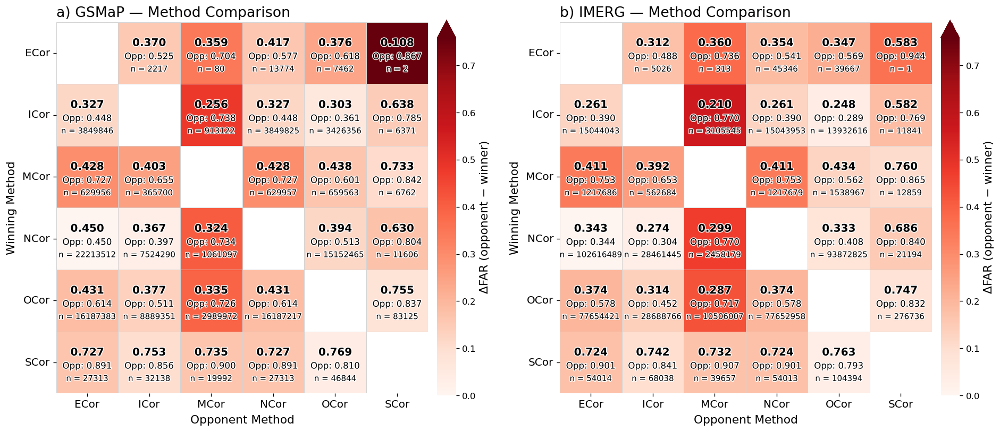

In [9]:
cmap, norm = choose_cmap_and_norm(gsmap_comp, imerg_comp)
fig, axes = plt.subplots(1, 2, figsize=(16, 7), dpi=120)
methods_heatmap( gsmap_comp, ax=axes[0], cmap=cmap, norm=norm, base_fontsize=10, tick_fontsize=12, cbar=True )
axes[0].set_title("a) GSMaP — Method Comparison", fontsize=16, loc='left', pad=6)
methods_heatmap( imerg_comp, ax=axes[1], cmap=cmap, norm=norm, base_fontsize=10, tick_fontsize=12, cbar=True)
axes[1].set_title("b) IMERG — Method Comparison", fontsize=16, loc='left', pad=6)
plt.tight_layout()
plt.show()

##### Extratification

In [20]:
def stratified_far_dataset(con, table_name, out_dir="queries/stratified_far_dataset/", filename=None, force=False):
    out_dir = pathlib.Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    if filename is None:
        filename = f"{table_name}_stratified_far.parquet"
    out_path = out_dir / filename

    if out_path.exists() and not force:
        return pd.read_parquet(out_path)

    query = f"""
        COPY (
            WITH
            -- (1) Filtro inicial otimizado: remove NEW e FAR inválidos logo no scan
            filtered AS (
                SELECT
                    uid,
                    method,
                    far,
                    size,
                    duration,
                    lifetime,
                    status,
                    far_      AS far_noc,
                    far_opt   AS far_opt,
                    far_inc   AS far_inc,
                    far_spl   AS far_spl,
                    far_mrg   AS far_mrg,
                    far_elp   AS far_elp
                FROM {table_name}
                WHERE size IS NOT NULL
                AND duration IS NOT NULL
                AND far IS NOT NULL
                AND far <> 1
                AND far <> 0
                AND status <> 'NEW'
                LIMIT 100000
            ),

            -- (2) Classificação revisada: "Continuous" = todas as linhas são CON
            event_agg AS (
                SELECT
                    uid,
                    AVG(size)     AS mean_size,
                    MAX(duration) AS duration_event,
                    CASE
                        WHEN COUNT(*) = SUM(CASE WHEN status = 'CON' THEN 1 ELSE 0 END)
                        THEN 'Continuous'
                        ELSE 'Non-Continuous'
                    END AS classification
                FROM filtered
                GROUP BY uid
            ),

            -- (3) Estatísticas globais (leves)
            global_stats AS (
                SELECT
                    AVG(mean_size)                              AS mean_size,
                    STDDEV_SAMP(mean_size)                      AS std_size,
                    AVG(mean_size) + STDDEV_SAMP(mean_size)     AS lim1_size,
                    AVG(mean_size) + 2 * STDDEV_SAMP(mean_size) AS lim2_size,
                    AVG(duration_event)                         AS mean_duration,
                    STDDEV_SAMP(duration_event)                 AS std_duration,
                    AVG(duration_event) + STDDEV_SAMP(duration_event) AS lim1_duration
                FROM event_agg
            )

            -- (4) Seleção final
            SELECT
                s.uid,
                a.classification,
                s.method,

                regexp_replace(
                    (CASE WHEN s.far_noc IS NOT NULL AND s.far_noc <> 1 AND s.method <> 'noc' THEN 'noc, ' ELSE '' END) ||
                    (CASE WHEN s.far_opt IS NOT NULL AND s.far_opt <> 1 AND s.method <> 'opt' THEN 'opt, ' ELSE '' END) ||
                    (CASE WHEN s.far_inc IS NOT NULL AND s.far_inc <> 1 AND s.method <> 'inc' THEN 'inc, ' ELSE '' END) ||
                    (CASE WHEN s.far_spl IS NOT NULL AND s.far_spl <> 1 AND s.method <> 'spl' THEN 'spl, ' ELSE '' END) ||
                    (CASE WHEN s.far_mrg IS NOT NULL AND s.far_mrg <> 1 AND s.method <> 'mrg' THEN 'mrg, ' ELSE '' END) ||
                    (CASE WHEN s.far_elp IS NOT NULL AND s.far_elp <> 1 AND s.method <> 'elp' THEN 'elp, ' ELSE '' END),
                    ', $', ''
                ) AS other_methods,

                s.far,
                s.size      AS size,
                s.lifetime  AS lifetime,
                a.mean_size,
                a.duration_event,

                CASE
                    WHEN a.mean_size < gs.mean_size THEN 'Small'
                    WHEN a.mean_size < gs.lim1_size THEN 'Medium'
                    ELSE 'Large'
                END AS size_class,

                CASE
                    WHEN a.duration_event < gs.mean_duration THEN 'Short'
                    WHEN a.duration_event < gs.lim1_duration THEN 'Medium'
                    ELSE 'Long'
                END AS duration_class

            FROM filtered s
            JOIN event_agg a USING (uid)
            CROSS JOIN global_stats gs
        ) TO '{out_path.as_posix()}'
        (FORMAT PARQUET, COMPRESSION ZSTD);
        """

    con.execute(query)
    return pd.read_parquet(out_path)

In [21]:
gsmap_stratified_far = stratified_far_dataset(con, "gsmap_tracking")
imerg_stratified_far = stratified_far_dataset(con, "imerg_tracking")

In [24]:
gsmap_stratified_far.groupby('duration_class')['duration_event'].describe()

,count,mean,std,min,25%,50%,75%,max
duration_class,,,,,,,,
Long,13427224.0,2145.683972,2416.739681,660.0,840.0,1260.0,2340.0,33660.0
Medium,13351529.0,415.523906,99.477125,300.0,300.0,420.0,480.0,600.0
Short,17702221.0,170.650804,48.163719,120.0,120.0,180.0,240.0,240.0


In [27]:
imerg_stratified_far.groupby('duration_class')['duration_event'].describe()

,count,mean,std,min,25%,50%,75%,max
duration_class,,,,,,,,
Long,53551843.0,2091.450754,2654.818627,630.0,810.0,1170.0,2100.0,36240.0
Medium,55904509.0,416.407446,91.841400,300.0,330.0,390.0,480.0,600.0
Short,81524383.0,184.295262,50.571777,120.0,150.0,180.0,240.0,270.0


In [6]:
from matplotlib.patches import Patch

def plot_far_violin_grid_dual_axes(
    df1: pd.DataFrame,
    df2: pd.DataFrame,
    *,
    binrange=(0.0, 1.0),
    figsize=(15, 10.5),
    color1="#174F87",               # GSMaP
    color2="#8E1F1A",               # IMERG
    sharey: bool = True,
    legend_mode: str = "global",
    title_prefix: str = "FAR — Violin Distributions (GSMaP vs IMERG)",
    title_size: int = 16,
    panel_title_size: int = 12,
    label_size: int = 11,
    tick_size: int = 9,
    legend_size: int = 10,
    show_stats: bool = True,
    show_n: bool = True,
    n_fontsize: int = 9,
) -> None:

    size_order = ["Small", "Medium", "Large"]
    dur_order  = ["Short", "Medium", "Long"]

    def _prep(df, src_name):
        d = df.dropna(subset=["far", "classification", "size_class", "duration_class"]).copy()
        d = d[(d["far"] >= binrange[0]) & (d["far"] <= binrange[1])]
        d["source"] = src_name
        d["size_class"] = pd.Categorical(d["size_class"], categories=size_order, ordered=True)
        d["duration_class"] = pd.Categorical(d["duration_class"], categories=dur_order, ordered=True)
        return d

    gsmap = _prep(df1, "GSMaP")
    imerg = _prep(df2, "IMERG")
    data = pd.concat([gsmap, imerg], ignore_index=True)

    sns.set_context("paper", font_scale=1.05)
    sns.set_style("whitegrid", {"axes.facecolor": "#F9F9F9"})  # Fundo neutro e claro

    fig, axes = plt.subplots(len(size_order), len(dur_order),
                             figsize=figsize, sharex=False, sharey=sharey)

    palette = {"GSMaP": color1, "IMERG": color2}
    hue_order = ["GSMaP", "IMERG"]
    cls_order = ["Continuous", "Non-Continuous"]

    for i, s in enumerate(size_order):
        for j, d in enumerate(dur_order):
            ax = axes[i, j]
            sub = data[(data["size_class"] == s) & (data["duration_class"] == d)]
            if sub.empty:
                ax.axis("off")
                continue

            sns.violinplot(
                data=sub,
                x="classification", y="far",
                hue="source", hue_order=hue_order,
                order=cls_order,
                palette=palette, cut=0, inner=None,
                linewidth=1.0, saturation=1.0, alpha=1.0,
                dodge=True, ax=ax
            )

            for c in ax.collections:
                c.set_alpha(1.0)
                c.set_edgecolor("black")
                c.set_linewidth(0.5)

            ax.set_title(f"{s} | {d}", fontsize=panel_title_size, pad=5)
            ax.tick_params(axis="y", labelsize=tick_size)
            ax.set_ylim(0, 1)
            ax.set_yticks(np.linspace(0, 1, 11))

            if j == 0:
                ax.set_ylabel("FAR", fontsize=label_size)
            else:
                ax.set_ylabel("")

            ax.set_xlabel("")
            if show_n:
                counts = (
                    sub.groupby(["source", "classification"])["far"]
                    .size()
                    .unstack(fill_value=0)
                    .astype(int)
                )

                def get_n(src, cls):
                    if src in counts.index and cls in counts.columns:
                        return counts.loc[src, cls]
                    return 0

                n_g_con = get_n("GSMaP", "Continuous")
                n_i_con = get_n("IMERG", "Continuous")
                n_g_non = get_n("GSMaP", "Non-Continuous")
                n_i_non = get_n("IMERG", "Non-Continuous")

                labels = [
                    f"Continuous\n(G: {n_g_con} | I: {n_i_con})",
                    f"Non-Continuous\n(G: {n_g_non} | I: {n_i_non})"
                ]
                ax.set_xticks([0, 1])
                ax.set_xticklabels(labels, fontsize=n_fontsize, ha="center")
            else:
                ax.set_xticks([0, 1])
                ax.set_xticklabels(cls_order, fontsize=tick_size)

            if show_stats:
                stats = sub.groupby(["source", "classification"])["far"].describe(percentiles=[.25, .5, .75])
                x_base_map = {cls_order[0]: 0, cls_order[1]: 1}
                x_offset_map = {hue_order[0]: -0.2, hue_order[1]: 0.2}

                mean_color = '#000000'
                quartile_color = '#333333'
                line_width = 0.15

                for (src, cls), s_stats in stats.iterrows():
                    if cls not in x_base_map or src not in x_offset_map:
                        continue
                    x_base = x_base_map[cls]
                    x_offset = x_offset_map[src]
                    xpos = x_base + x_offset

                    mean_val = s_stats['mean']
                    q1_val = s_stats['25%']
                    median_val = s_stats['50%']
                    q3_val = s_stats['75%']

                    ax.hlines(mean_val, xpos - line_width, xpos + line_width,
                              colors=mean_color, lw=2.5, ls="--", alpha=0.9)
                    ax.hlines(median_val, xpos - line_width, xpos + line_width,
                              colors=quartile_color, lw=2.0, ls="-", alpha=0.9)
                    ax.hlines([q1_val, q3_val], xpos - line_width, xpos + line_width,
                              colors=quartile_color, lw=1.0, ls="-", alpha=0.8)
            if ax.get_legend() is not None:
                ax.get_legend().remove()
    fig.suptitle(title_prefix, fontsize=title_size, fontweight="bold", y=0.99)

    if legend_mode == "global":
        handles = [Patch(facecolor=palette[src], edgecolor="black", label=src) for src in hue_order]
        fig.legend(handles=handles, loc="upper center",
                   ncol=2, fontsize=legend_size, frameon=False, bbox_to_anchor=(0.5, 0.95))

    plt.tight_layout(rect=[0, 0.05, 1, 0.92])
    plt.show()

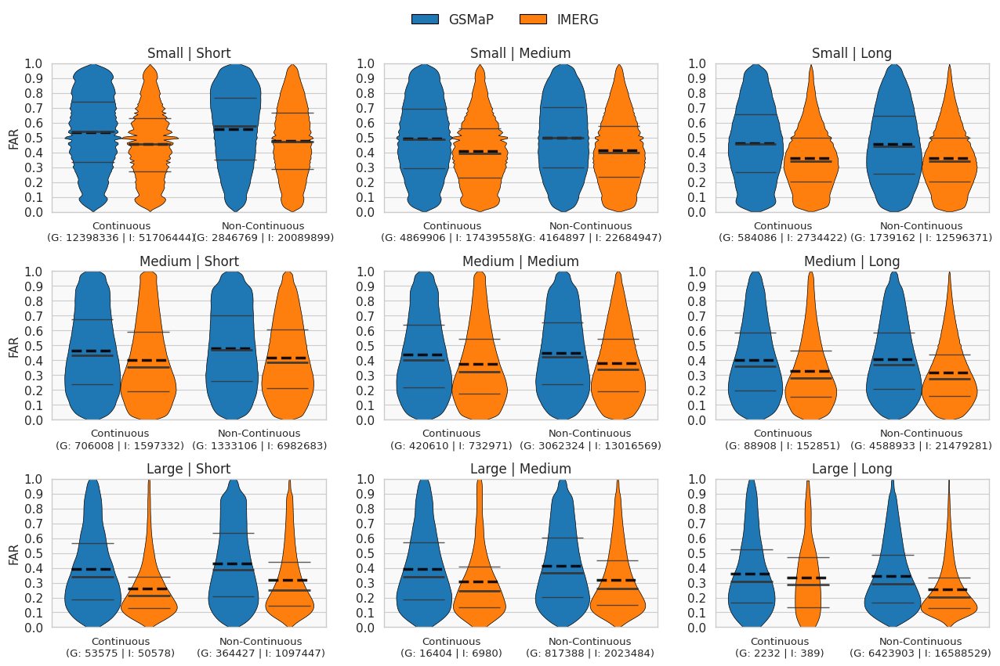

In [14]:
plot_far_violin_grid_dual_axes(
    gsmap_stratified_far,
    imerg_stratified_far,
    binrange=(0.0, 1.0),
    figsize=(13, 9.5),
    color1="C0", color2="C1",
    sharey=False,
    legend_mode="global",
    title_prefix="",
    title_size=16,
    panel_title_size=12,
    label_size=11,
    tick_size=11,
    legend_size=12,
    show_stats=True,
    n_fontsize=9.5
)

In [15]:
def calc_summary_far(con, file, summary_name="gsmap_stratified_far_summary"):
    query_summary = f"""
    CREATE OR REPLACE TABLE {summary_name} AS
    SELECT
        classification,
        size_class,
        duration_class,
        method,

        -- Estatísticas de FAR
        AVG(far)                AS far_mean,
        MEDIAN(far)             AS far_median,
        QUANTILE_CONT(far, 0.25) AS far_p25,
        QUANTILE_CONT(far, 0.75) AS far_p75,
        STDDEV(far)             AS far_std,
        COUNT(*)                AS n,

        -- Estatísticas complementares
        AVG(size)               AS mean_size,
        AVG(duration_event)     AS mean_duration

    FROM '{file}'
    GROUP BY
        classification, size_class, duration_class, method
    ORDER BY
        classification, size_class, duration_class, method;
    """
    con.execute(query_summary)
    return con.execute(f"SELECT * FROM {summary_name}").df()

In [16]:
gsmap_summary = calc_summary_far(con, "queries/stratified_far_dataset/gsmap_tracking_stratified_far.parquet")
imerg_summary = calc_summary_far(con, "queries/stratified_far_dataset/imerg_tracking_stratified_far.parquet")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [17]:
# Replace method codes with names
method_names = {
    'noc': 'NCor',
    'opt': 'OCor',
    'inc': 'ICor',
    'spl': 'SCor',
    'mrg': 'MCor',
    'elp': 'ECor'
}
gsmap_summary['method'] = gsmap_summary['method'].map(method_names)
imerg_summary['method'] = imerg_summary['method'].map(method_names)

In [29]:
from matplotlib.colors import LinearSegmentedColormap, Normalize


def plot_heatmaps_by_classification(
    gsmap_summary: pd.DataFrame,
    imerg_summary: pd.DataFrame,
    *,
    classification_filter: str = "Continuous",
    value_col: str = "far_mean",
    median_col: str = "far_median",
    count_col: str = "n",
    p25_col: str = "far_p25",
    p75_col: str = "far_p75",
    std_col: str = "far_std",
    cmap_style: str = "balanced",
    normalize: str | tuple = "dynamic",
    reverse_methods: bool = True,
    annot_detail: str = "compact",
    mark_best: bool = True,
    font_auto: bool = True,
    font_far: float | None = None,
    font_stats: float | None = None,
    font_n: float | None = None,
    font_scale: float = 1.0,
    method_order=["NCor", "ICor", "OCor", "MCor", "ECor", "SCor"]
):

    # Colormap setup
    # ----------------------------------------------------------
    def _make_cmap(style="balanced"):
        if style == "softer":
            return LinearSegmentedColormap.from_list("soft_inv",
                ["#0E4A7A", "#2C76B8", "#F6F6F6", "#EF9A86", "#B2332B"])
        elif style == "neutral":
            return LinearSegmentedColormap.from_list("neutral_inv",
                ["#134F7F", "#3F86C5", "#FAFAFA", "#F1A697", "#B23A32"])
        return LinearSegmentedColormap.from_list("balanced_inv",
            ["#0B3C6D", "#2A74B3", "#F2F2F2", "#F08F7B", "#A61E1A"])

    cmap = _make_cmap(cmap_style)

    # ----------------------------------------------------------
    # Data preparation
    # ----------------------------------------------------------
    def _prepare(df: pd.DataFrame, method_order):
        df = df[df["classification"] == classification_filter].copy()
        df["score_quality"] = (1 - df[value_col]) * np.sqrt(df[count_col].fillna(0)) / (1 + df[std_col].fillna(0))
        best_idx = df.groupby(["size_class", "duration_class"])["score_quality"].idxmax()
        df["is_best"] = df.index.isin(best_idx)
        df["stratum"] = df["size_class"].astype(str) + " | " + df["duration_class"].astype(str)
        df["method"] = pd.Categorical(df["method"], categories=method_order, ordered=True)
        df = df.sort_values(["size_class", "duration_class", "method"])
        mat = df.pivot(index="stratum", columns="method", values=value_col)
        mat = mat.reindex(columns=method_order)
        mat = mat.reindex(index=mat.index[::-1])
        return df, mat

    df_gs, mat_gs = _prepare(gsmap_summary, method_order)
    df_im, mat_im = _prepare(imerg_summary, method_order)

    both = pd.merge(
        df_gs[df_gs["is_best"]][["size_class", "duration_class", "method"]],
        df_im[df_im["is_best"]][["size_class", "duration_class", "method"]],
        on=["size_class", "duration_class", "method"], how="inner"
    )
    both_key = set(zip(both["size_class"], both["duration_class"], both["method"]))

    # ----------------------------------------------------------
    # Normalization
    # ----------------------------------------------------------
    if normalize == "global01":
        vmin, vmax = 0.0, 1.0
    elif isinstance(normalize, tuple) and len(normalize) == 3 and normalize[0] == "fixed":
        _, vmin, vmax = normalize
    else:
        vmin = min(mat_gs.min().min(), mat_im.min().min())
        vmax = max(mat_gs.max().max(), mat_im.max().max())
        if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
            vmin, vmax = 0.0, 1.0
    norm = Normalize(vmin=vmin, vmax=vmax)

    n_rows = max(mat_gs.shape[0], mat_im.shape[0])
    n_cols = max(mat_gs.shape[1], mat_im.shape[1])
    fig_h = max(8, n_rows * 0.55)
    fig_w = max(16, n_cols * 2.0)

    def _autosize(nr, nc, base=7.0):
        s = min(1.0, 12.0 / max(nr, 6)) * min(1.0, 10.0 / max(nc, 4))
        return base*s, (base-1)*s, (base-2)*s

    base_default = 7.0 if classification_filter == "Continuous" else 6.0
    auto_far, auto_stats, auto_n = _autosize(n_rows, n_cols, base_default) if font_auto else (7.0, 6.0, 5.0)
    F_FAR   = (font_far   if font_far   is not None else auto_far)   * font_scale
    F_STATS = (font_stats if font_stats is not None else auto_stats) * font_scale
    F_N     = (font_n     if font_n     is not None else auto_n)     * font_scale

    # ----------------------------------------------------------
    # Heatmaps
    # ----------------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(fig_w, fig_h), sharey=True)
    sns.set_context("paper", font_scale=0.85)
    sns.set_style("whitegrid")

    def _draw(ax, data, title):
        hm = sns.heatmap(data, cmap=cmap, norm=norm, cbar=False, linewidths=0.4, linecolor="gray", ax=ax)
        ax.set_title(title, fontsize=13, weight="bold", pad=12)
        ax.set_xlabel("Method", fontsize=10)
        ax.set_ylabel("Size | Duration", fontsize=10)
        ax.tick_params(axis="x", labelsize=10)
        ax.tick_params(axis="y", labelsize=10)
        return hm

    _ = _draw(axes[0], mat_gs, f"a) GSMaP – {classification_filter}")
    _ = _draw(axes[1], mat_im, f"b) IMERG – {classification_filter}")

    # ----------------------------------------------------------
    # Annotations with Score Quality
    # ----------------------------------------------------------
    def _reorder_stats(df_stats, cols):
        d = df_stats.copy()
        d["method"] = pd.Categorical(d["method"], categories=list(cols), ordered=True)
        return d.sort_values(["size_class", "duration_class", "method"])

    def _annot(ax, matrix: pd.DataFrame, stats: pd.DataFrame):
        stats = _reorder_stats(stats, matrix.columns)
        bbox_main = dict(boxstyle="round,pad=0.18", facecolor="white", edgecolor="none", alpha=0.72)
        bbox_n    = dict(boxstyle="round,pad=0.08", facecolor="white", edgecolor="none", alpha=0.72)
        for iy, ylab in enumerate(matrix.index):
            sc, dc = ylab.split(" | ", 1)
            for ix, xlab in enumerate(matrix.columns):
                row = stats[(stats["size_class"].astype(str)==sc) &
                            (stats["duration_class"].astype(str)==dc) &
                            (stats["method"].astype(str)==str(xlab))]
                if row.empty:
                    continue
                r = row.iloc[0]
                star = ""
                if mark_best:
                    key = (r["size_class"], r["duration_class"], r["method"])
                    star = " ★★" if key in both_key else (" ★" if r["is_best"] else "")

                # ----------------------------------------------------------
                # Alteração: substitui linha Md±std por Q = score_quality
                # ----------------------------------------------------------
                if annot_detail == "far-only":
                    lines = [f"FAR={r[value_col]:.2f}{star}"]
                    fsize = F_FAR
                    fweight = "bold"
                elif annot_detail == "compact":
                    lines = [f"FAR={r[value_col]:.2f}{star}",
                             f"Q={r['score_quality']:.2f}"]
                    fsize = F_STATS
                    fweight = "normal"
                else:
                    lines = [f"FAR={r[value_col]:.2f}{star}",
                             f"Q={r['score_quality']:.2f}",
                             f"IQR=[{r[p25_col]:.2f}–{r[p75_col]:.2f}]"]
                    fsize = F_STATS
                    fweight = "normal"

                x, y = ix + 0.5, iy + 0.5
                ax.text(x, y, "\n".join(lines), ha="center", va="center",
                        fontsize=fsize, fontweight=fweight, color="#111", bbox=bbox_main)
                ax.text(x+0.43, y+0.38, f"n={int(r[count_col]) if pd.notna(r[count_col]) else 0}",
                        ha="right", va="bottom", fontsize=F_N, color="#222", bbox=bbox_n)

    _annot(axes[0], mat_gs, df_gs)
    _annot(axes[1], mat_im, df_im)

    # ----------------------------------------------------------
    # Colorbar
    # ----------------------------------------------------------
    cbar_ax = fig.add_axes([0.905, 0.18, 0.010, 0.68])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
    cbar = fig.colorbar(sm, cax=cbar_ax, extend="both")
    cbar.set_label("Mean FAR" if normalize!="global01" else "Mean FAR (0–1)", fontsize=11)
    cbar.ax.tick_params(labelsize=9)
    ticks = (np.arange(0, 1.01, 0.25) if normalize=="global01" else np.linspace(vmin, vmax, 10))
    cbar.set_ticks(ticks)
    cbar.ax.set_yticklabels([f"{t:.2f}" for t in ticks])

    plt.tight_layout(rect=[0, 0, 0.89, 1])
    plt.show()

    best_gs = df_gs[df_gs["is_best"]]
    best_im = df_im[df_im["is_best"]]
    return best_gs, best_im, both, df_gs, df_im


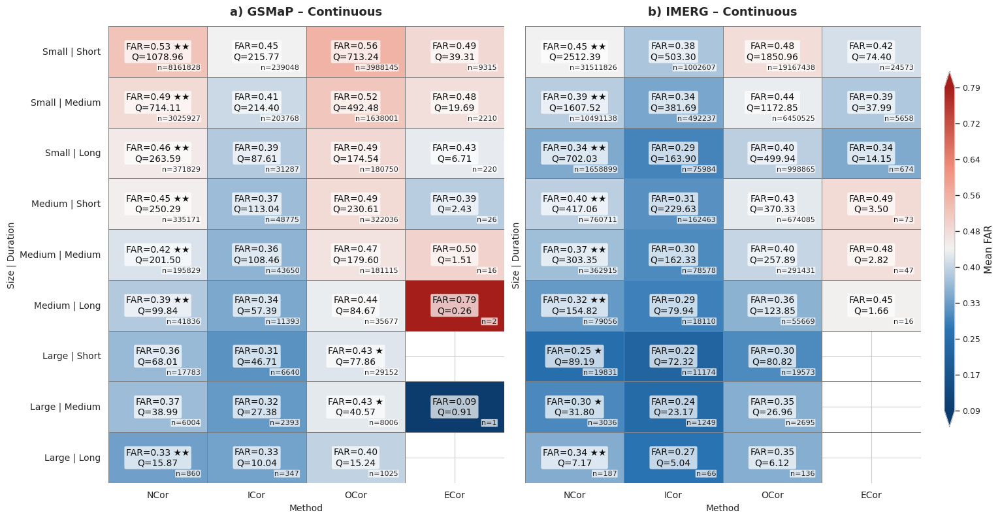

In [30]:
best_con, best_imerg_con, best_both_con, df_gs, df_im = plot_heatmaps_by_classification(gsmap_summary, imerg_summary, 
    annot_detail="compact", font_far=20.0, font_stats=10, font_n=8, classification_filter="Continuous", method_order=["NCor", "ICor", "OCor", "ECor"])


In [35]:
df_gs.to_csv("tables/gsmap_stratified_far_summary_detailed.csv", index=False)
df_im.to_csv("tables/imerg_stratified_far_summary_detailed.csv", index=False)

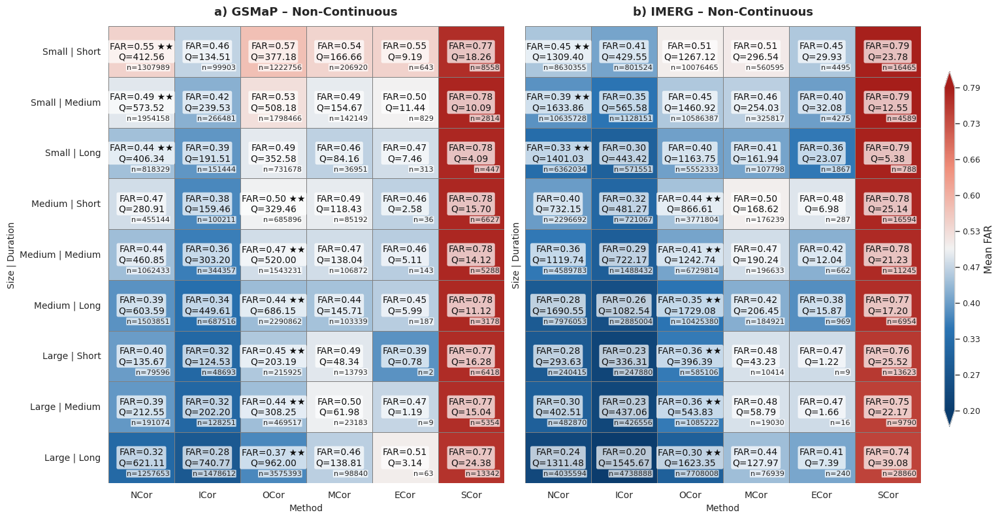

In [34]:
best_ncon, best_imerg_ncon, best_both_ncon, df_gs_ncon, df_im_ncon = plot_heatmaps_by_classification(gsmap_summary, imerg_summary,
    annot_detail="compact", font_far=10, font_stats=10, font_n=8, classification_filter="Non-Continuous", method_order=["NCor", "ICor", "OCor", "MCor", "ECor", "SCor"])


In [37]:
df_gs_ncon.to_csv("tables/gsmap_stratified_far_summary_detailed_ncon.csv", index=False)
df_im_ncon.to_csv("tables/imerg_stratified_far_summary_detailed_ncon.csv", index=False)

In [28]:
best_imerg_ncon

,classification,size_class,duration_class,method,far_mean,far_median,far_p25,far_p75,far_std,n,mean_size,mean_duration,score_quality,is_best,stratum
37,Non-Continuous,Large,Long,OCor,0.299621,0.246136,0.146356,0.414500,0.197821,7708008,2849.297843,3661.362780,1623.350100,True,Large | Long
43,Non-Continuous,Large,Medium,OCor,0.357689,0.305556,0.169661,0.515152,0.230393,1085222,1293.292562,447.340775,543.827018,True,Large | Medium
49,Non-Continuous,Large,Short,OCor,0.358830,0.298533,0.165814,0.520000,0.237279,585106,1382.873601,194.496143,396.390167,True,Large | Short
55,Non-Continuous,Medium,Long,OCor,0.351345,0.314607,0.184466,0.492891,0.211280,10425380,227.618764,1367.191195,1729.081689,True,Medium | Long
61,Non-Continuous,Medium,Medium,OCor,0.407485,0.377049,0.214286,0.583333,0.236857,6729814,195.435999,438.884104,1242.743460,True,Medium | Medium
67,Non-Continuous,Medium,Short,OCor,0.441557,0.417391,0.232558,0.639344,0.251490,3771804,188.221939,199.205046,866.614200,True,Medium | Short
72,Non-Continuous,Small,Long,NCor,0.333520,0.315068,0.180556,0.457143,0.199883,6362034,56.938383,1016.169640,1401.025141,True,Small | Long
78,Non-Continuous,Small,Medium,NCor,0.385787,0.369231,0.207317,0.538462,0.225996,10635728,47.567911,422.194061,1633.855780,True,Small | Medium
84,Non-Continuous,Small,Short,NCor,0.446431,0.437500,0.258065,0.625000,0.241977,8630355,41.869910,198.334220,1309.400600,True,Small | Short


In [36]:
# Create a query to select uid from "queries/stratified_far_dataset/gsmap_tracking_stratified_far.parquet" where classification is 'Continuous' and Large and Long
gsmap_uid_con_larger_lon_list = con.execute("""
    SELECT DISTINCT uid
    FROM 'queries/stratified_far_dataset/gsmap_tracking_stratified_far.parquet'
""").df()['uid'].tolist()

imerg_uid_con_larger_lon_list = con.execute("""
    SELECT DISTINCT uid
    FROM 'queries/stratified_far_dataset/imerg_tracking_stratified_far.parquet'
""").df()['uid'].tolist()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [37]:
def get_start_end_trajectory(con, uids, table, file):
    out_path = pathlib.Path(file)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    # check if file exists
    if out_path.exists():
        return pd.read_parquet(out_path)
    uids = ', '.join(f"'{uid}'" for uid in uids)
    query = f"""
    WITH cindex_bounds AS (
        SELECT
            uid,
            MIN(cindex) AS start_cindex,
            MAX(cindex) AS end_cindex
        FROM {table}
        WHERE uid IN ({uids})
        GROUP BY uid
    ),
    start_geom AS (
        SELECT 
            g.uid,
            b.start_cindex,
            g.timestamp AS start_timestamp,
            ST_Centroid(ST_GeomFromText(g.geometry)) AS start_geom
        FROM {table} g
        JOIN cindex_bounds b 
          ON g.uid = b.uid AND g.cindex = b.start_cindex
    ),
    end_geom AS (
        SELECT 
            g.uid,
            b.end_cindex,
            g.timestamp AS end_timestamp,
            ST_Centroid(ST_GeomFromText(g.geometry)) AS end_geom,
            g.trajectory
        FROM {table} g
        JOIN cindex_bounds b 
          ON g.uid = b.uid AND g.cindex = b.end_cindex
    ),
    path AS (
        SELECT 
            s.uid,
            s.start_cindex,
            e.end_cindex,
            s.start_timestamp,
            e.end_timestamp,
            ST_AsText(s.start_geom) AS start_geometry,
            ST_AsText(e.end_geom)   AS end_geometry,
            e.trajectory,
            ST_X(s.start_geom) AS lon1,
            ST_Y(s.start_geom) AS lat1,
            ST_X(e.end_geom)   AS lon2,
            ST_Y(e.end_geom)   AS lat2
        FROM start_geom s
        JOIN end_geom e USING (uid)
    )
    SELECT
        *,
        -- Distância Haversine entre os centroides (km)
        6371.0 * 2 * ASIN(
            SQRT(
                POWER(SIN(RADIANS(lat2 - lat1) / 2), 2) +
                COS(RADIANS(lat1)) * COS(RADIANS(lat2)) *
                POWER(SIN(RADIANS(lon2 - lon1) / 2), 2)
            )
        ) AS start_end_haversine_km,
        -- Comprimento da trajectory
        ST_Length(
          ST_Transform(
            ST_GeomFromText(trajectory),
            'EPSG:4326','EPSG:3857'
          )
        ) / 1000.0 AS trajectory_length_km
    FROM path
    """

    con.execute(f"""
        COPY ({query})
        TO '{out_path.as_posix()}'
        (FORMAT 'parquet', OVERWRITE)
    """)
    print(f"Start, end, and trajectory data saved to {out_path}")

In [7]:
gsmap_larger_longer_df = get_start_end_trajectory(con, gsmap_uid_con_larger_lon_list, 'gsmap_tracking', 'queries/start_end_trajectory/gsmap_tracking_longer.parquet')
imerg_larger_longer_df = get_start_end_trajectory(con, imerg_uid_con_larger_lon_list, 'imerg_tracking', 'queries/start_end_trajectory/imerg_tracking_longer.parquet')

# Create SEASONAL CATEGORY column based on the month of start_timestamp ['DJF', 'MAM', 'JJA', 'SON']
def assign_seasonal_category(df):
    def month_to_season(month):
        if month in [12, 1, 2]:
            return 'DJF'
        elif month in [3, 4, 5]:
            return 'MAM'
        elif month in [6, 7, 8]:
            return 'JJA'
        elif month in [9, 10, 11]:
            return 'SON'
        return None
    df['start_timestamp'] = pd.to_datetime(df['start_timestamp'])
    df['seasonal_category'] = df['start_timestamp'].dt.month.apply(month_to_season)
    return df
# Apply seasonal category assignment
gsmap_larger_longer_df = assign_seasonal_category(gsmap_larger_longer_df)
imerg_larger_longer_df = assign_seasonal_category(imerg_larger_longer_df)

# Filter dataframes where start_end_haversine_km >= 1000
gsmap_larger_longer_df = gsmap_larger_longer_df[gsmap_larger_longer_df['start_end_haversine_km'] >= 1000]
imerg_larger_longer_df = imerg_larger_longer_df[imerg_larger_longer_df['start_end_haversine_km'] >= 1000]

# Load columns start_geometry, end_geometry, trajectory using gpd.GeoSeries.from_wkt()
gsmap_larger_longer_df['start_geometry'] = gpd.GeoSeries.from_wkt(gsmap_larger_longer_df['start_geometry'])
gsmap_larger_longer_df['end_geometry'] = gpd.GeoSeries.from_wkt(gsmap_larger_longer_df['end_geometry'])
gsmap_larger_longer_df['trajectory'] = gpd.GeoSeries.from_wkt(gsmap_larger_longer_df['trajectory'])

imerg_larger_longer_df['start_geometry'] = gpd.GeoSeries.from_wkt(imerg_larger_longer_df['start_geometry'])
imerg_larger_longer_df['end_geometry'] = gpd.GeoSeries.from_wkt(imerg_larger_longer_df['end_geometry'])
imerg_larger_longer_df['trajectory'] = gpd.GeoSeries.from_wkt(imerg_larger_longer_df['trajectory'])

# Convert to geopandas GeoDataFrame
gsmap_larger_longer_df = gpd.GeoDataFrame(gsmap_larger_longer_df)
imerg_larger_longer_df = gpd.GeoDataFrame(imerg_larger_longer_df)

In [64]:
def _wrap_lon(lon):
    """Normaliza lon para o intervalo [-180, 180)."""
    lon = ((lon + 180.0) % 360.0) - 180.0
    lon = np.where(np.isclose(lon, 180.0), -180.0, lon)
    return lon

def _grid_index(lon, lat, *, lon_min=-180.0, lon_max=180.0, lat_min=-60.0, lat_max=60.0, step=10.0):
    """
    Converte lon/lat em (col, row_sul→norte, qid_norte0, lon_center, lat_center).
    A numeração do quadrante (qid) começa no NORTE (linha superior) em 0.
    Retorna None se fora da janela.
    """
    lon = float(lon); lat = float(lat)
    lon = ((lon + 180.0) % 360.0) - 180.0
    if not (lon_min <= lon < lon_max) or not (lat_min <= lat < lat_max):
        return None

    ncols = int((lon_max - lon_min) / step)
    nrows = int((lat_max - lat_min) / step)

    col_s = int(np.floor((lon - lon_min) / step))           # 0 .. ncols-1 (oeste→leste)
    row_s = int(np.floor((lat - lat_min) / step))           # 0 .. nrows-1 (SUL→NORTE)

    # reindexa linha para 0 no NORTE (topo)
    row_n = (nrows - 1) - row_s                             # 0 .. nrows-1 (NORTE→SUL)

    # quadrante 0-based iniciando no NORTE, varrendo esquerda→direita (W→E)
    qid = row_n * ncols + col_s                             # 0 .. nrows*ncols-1

    lon_c = lon_min + (col_s + 0.5) * step
    lat_c = lat_min + (row_s + 0.5) * step
    return col_s, row_s, qid, lon_c, lat_c

def _grid_frame(lon_min=-180.0, lon_max=180.0, lat_min=-60.0, lat_max=60.0, step=10.0):
    """
    DataFrame completo da grade com numeração de quadrante começando no NORTE como 0.
    """
    ncols = int((lon_max - lon_min) / step)
    nrows = int((lat_max - lat_min) / step)

    rows = []
    for row_s in range(nrows):                   # SUL→NORTE
        row_n = (nrows - 1) - row_s              # NORTE→SUL
        for col_s in range(ncols):               # OESTE→LESTE
            qid = row_n * ncols + col_s          # NORTE-0
            lon0 = lon_min + col_s * step
            lon1 = lon_min + (col_s + 1) * step
            lat0 = lat_min + row_s * step
            lat1 = lat_min + (row_s + 1) * step
            rows.append({
                "quad_id": qid, "col": col_s, "row_s": row_s, "row_n": row_n,
                "lon_center": lon0 + 0.5 * step, "lat_center": lat0 + 0.5 * step,
                "lon0": lon0, "lon1": lon1, "lat0": lat0, "lat1": lat1
            })
    return pd.DataFrame(rows)

def summarize_quadrants(
    gdf: gpd.GeoDataFrame,
    *,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col=None,
    season=None,
    lon_min=-180.0, lon_max=180.0, lat_min=-60.0, lat_max=60.0,
    step=10.0
) -> pd.DataFrame:
    """
    Retorna colunas:
      quad_id (0-based, começa no NORTE), Qtdy_Start, Qtdy_End,
      Common_Dest (quad_id 0-based), Common_Dest_Count,
      lon_center, lat_center, lon0, lon1, lat0, lat1, col, row_s, row_n
    """
    df = gdf
    if season_col and season is not None:
        df = df[df[season_col] == season].copy()

    # extrai lon/lat iniciais/finais
    s_lon = _wrap_lon(df[start_col].x.values)
    s_lat = df[start_col].y.values
    e_lon = _wrap_lon(df[end_col].x.values)
    e_lat = df[end_col].y.values

    # binagem vetorizada (loop leve sobre arrays)
    def _vec_grid_id(lons, lats):
        ids = np.full(lons.shape[0], -1, dtype=int)
        cols = np.full_like(ids, -1)
        rows_s = np.full_like(ids, -1)
        for i, (lo, la) in enumerate(zip(lons, lats)):
            idx = _grid_index(lo, la, lon_min=lon_min, lon_max=lon_max, lat_min=lat_min, lat_max=lat_max, step=step)
            if idx is not None:
                c, r_s, q, _, _ = idx
                ids[i] = q; cols[i] = c; rows_s[i] = r_s
        return ids, cols, rows_s

    q_s, _, _ = _vec_grid_id(s_lon, s_lat)
    q_e, _, _ = _vec_grid_id(e_lon, e_lat)

    valid = (q_s >= 0) & (q_e >= 0)
    q_s = q_s[valid]
    q_e = q_e[valid]

    # contagens
    starts = pd.Series(q_s, name="quad_id").value_counts(sort=False).rename_axis("quad_id").reset_index(name="Qtdy_Start")
    ends   = pd.Series(q_e, name="quad_id").value_counts(sort=False).rename_axis("quad_id").reset_index(name="Qtdy_End")

    # matriz OD para Common Dest
    od = pd.DataFrame({"q_s": q_s, "q_e": q_e}).value_counts().rename("count").reset_index()
    common_dest = (od.sort_values(["q_s", "count"], ascending=[True, False])
                     .groupby("q_s", as_index=False).first()
                     .rename(columns={"q_s":"quad_id", "q_e":"Common_Dest", "count":"Common_Dest_Count"}))

    # grade completa e merge
    grid = _grid_frame(lon_min, lon_max, lat_min, lat_max, step)
    out = (grid
           .merge(starts, on="quad_id", how="left")
           .merge(ends,   on="quad_id", how="left")
           .merge(common_dest, on="quad_id", how="left"))

    out["Qtdy_Start"] = out["Qtdy_Start"].fillna(0).astype(int)
    out["Qtdy_End"]   = out["Qtdy_End"].fillna(0).astype(int)
    out["Common_Dest"] = out["Common_Dest"].fillna(-1).astype(int)
    out["Common_Dest_Count"] = out["Common_Dest_Count"].fillna(0).astype(int)

    cols = ["quad_id","col","row_s","row_n","lon_center","lat_center",
            "lon0","lon1","lat0","lat1","Qtdy_Start","Qtdy_End","Common_Dest","Common_Dest_Count"]
    return out[cols]

In [76]:
gsmap_summary_jja = summarize_quadrants(
    gsmap_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="JJA",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

gsmap_summary_djf = summarize_quadrants(
    gsmap_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="DJF",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

gsmap_summary_mam = summarize_quadrants(
    gsmap_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="MAM",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

gsmap_summary_son = summarize_quadrants(
    gsmap_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="SON",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

In [77]:
imerg_summary_jja = summarize_quadrants(
    imerg_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="JJA",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

imerg_summary_djf = summarize_quadrants(
    imerg_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="DJF",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

imerg_summary_mam = summarize_quadrants(
    imerg_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="MAM",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

imerg_summary_son = summarize_quadrants(
    imerg_larger_longer_df,
    start_col="start_geometry",
    end_col="end_geometry",
    season_col="seasonal_category",
    season="SON",
    lon_min=-180, lon_max=180, lat_min=-60, lat_max=60, step=10
)

In [78]:
# Create concordance column based on Common_Dest between GSMaP and IMERG summaries
def create_concordance_column(gsmap_df, imerg_df):
    gsmap_dict = gsmap_df.set_index('quad_id')['Common_Dest'].to_dict()
    imerg_dict = imerg_df.set_index('quad_id')['Common_Dest'].to_dict()

    concordance = []
    for qid in gsmap_df['quad_id']:
        gsmap_dest = gsmap_dict.get(qid, -1)
        imerg_dest = imerg_dict.get(qid, -1)
        if gsmap_dest == -1 or imerg_dest == -1:
            concordance.append(0)
        elif gsmap_dest == imerg_dest:
            concordance.append(1)
        else:
            concordance.append(-1)
    return concordance

gsmap_summary_jja['Concordance'] = create_concordance_column(gsmap_summary_jja, imerg_summary_jja)
gsmap_summary_djf['Concordance'] = create_concordance_column(gsmap_summary_djf, imerg_summary_djf)
gsmap_summary_mam['Concordance'] = create_concordance_column(gsmap_summary_mam, imerg_summary_mam)
gsmap_summary_son['Concordance'] = create_concordance_column(gsmap_summary_son, imerg_summary_son)
imerg_summary_jja['Concordance'] = create_concordance_column(gsmap_summary_jja, imerg_summary_jja)
imerg_summary_djf['Concordance'] = create_concordance_column(gsmap_summary_djf, imerg_summary_djf)
imerg_summary_mam['Concordance'] = create_concordance_column(gsmap_summary_mam, imerg_summary_mam)
imerg_summary_son['Concordance'] = create_concordance_column(gsmap_summary_son, imerg_summary_son)

Text(0.0, 1.0, 'b) IMERG (DJF) Longer PS Trajectory Diagram')

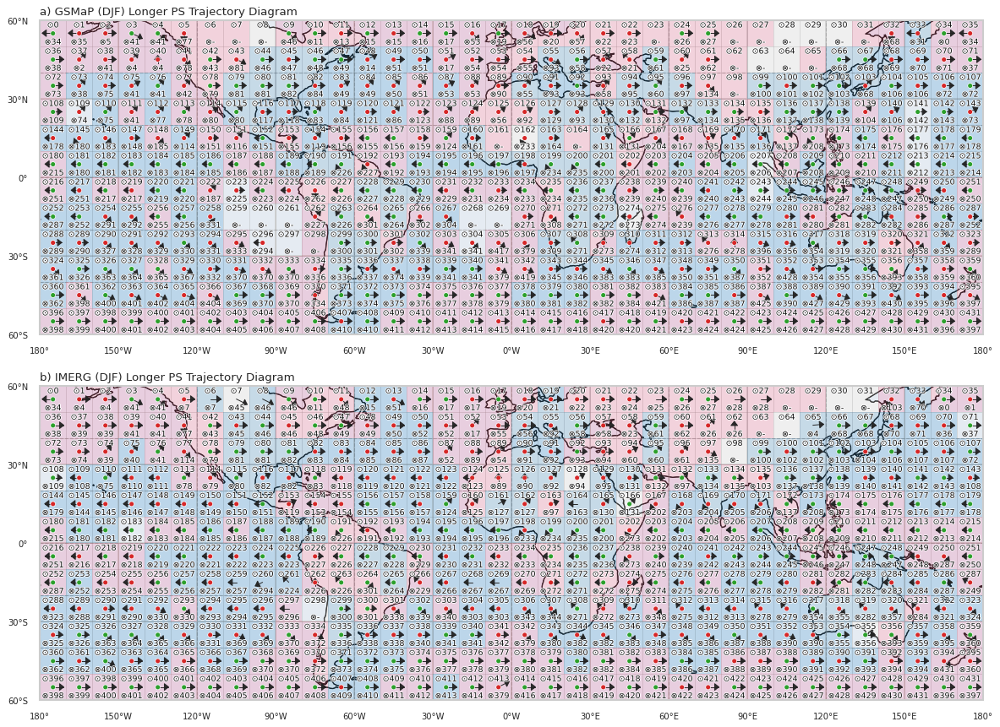

In [147]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_djf,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[0],
    figsize=(14, 12)
)

plots.trajectory_map(
    imerg_summary_djf,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[1],
    figsize=(14, 12)
)
axes[0].set_title("a) GSMaP (DJF) Longer PS Trajectory Diagram", loc='left', fontsize=12)
axes[1].set_title("b) IMERG (DJF) Longer PS Trajectory Diagram", loc='left', fontsize=12)

Text(0.0, 1.0, 'd) IMERG (MAM) Longer PS Trajectory Diagram')

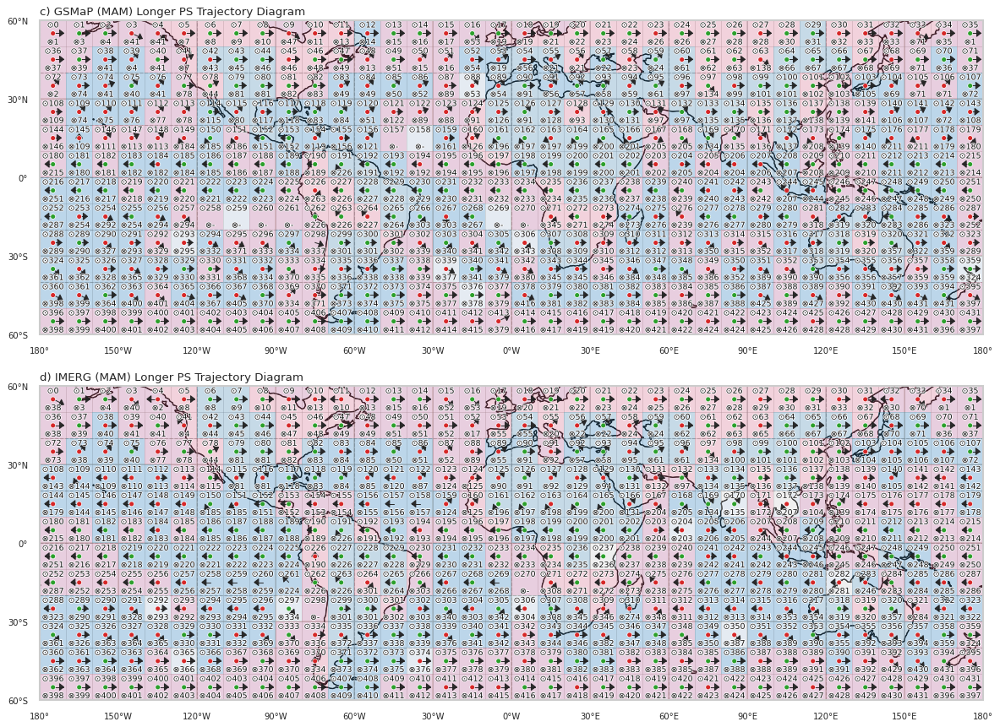

In [148]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_mam,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[0],
    figsize=(14, 12)
)

plots.trajectory_map(
    imerg_summary_mam,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[1],
    figsize=(14, 12)
)
axes[0].set_title("c) GSMaP (MAM) Longer PS Trajectory Diagram", loc='left', fontsize=12)
axes[1].set_title("d) IMERG (MAM) Longer PS Trajectory Diagram", loc='left', fontsize=12)

Text(0.0, 1.0, 'f) IMERG (JJA) Longer PS Trajectory Diagram')

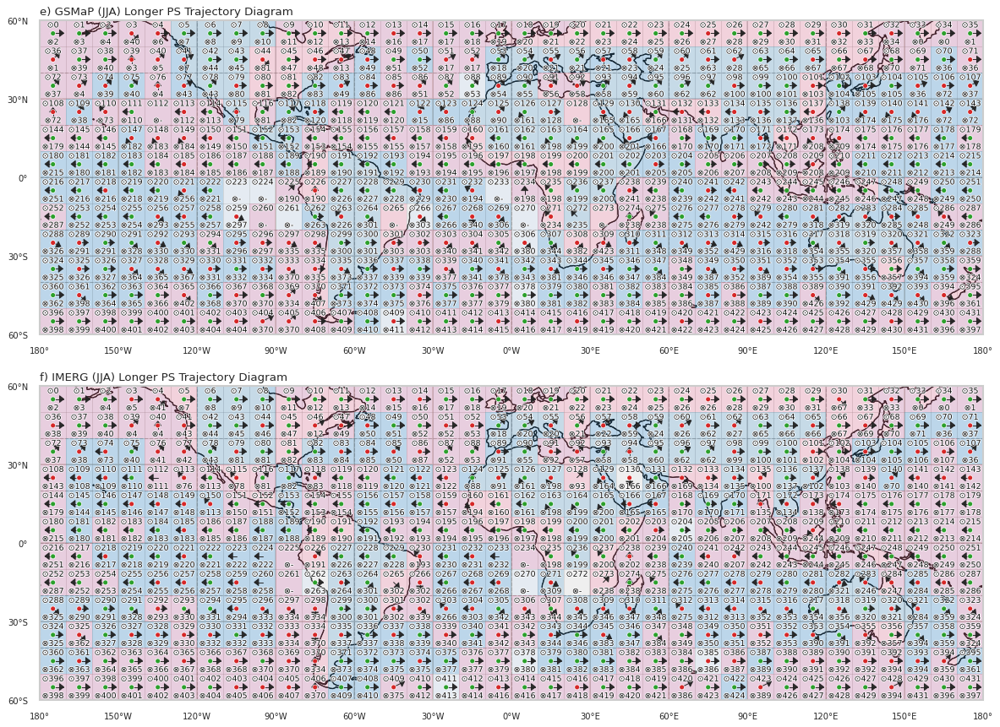

In [149]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_jja,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[0],
    figsize=(14, 12)
)

plots.trajectory_map(
    imerg_summary_jja,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[1],
    figsize=(14, 12)
)
axes[0].set_title("e) GSMaP (JJA) Longer PS Trajectory Diagram", loc='left', fontsize=12)
axes[1].set_title("f) IMERG (JJA) Longer PS Trajectory Diagram", loc='left', fontsize=12)

Text(0.0, 1.0, 'h) IMERG (SON) Longer PS Trajectory Diagram')

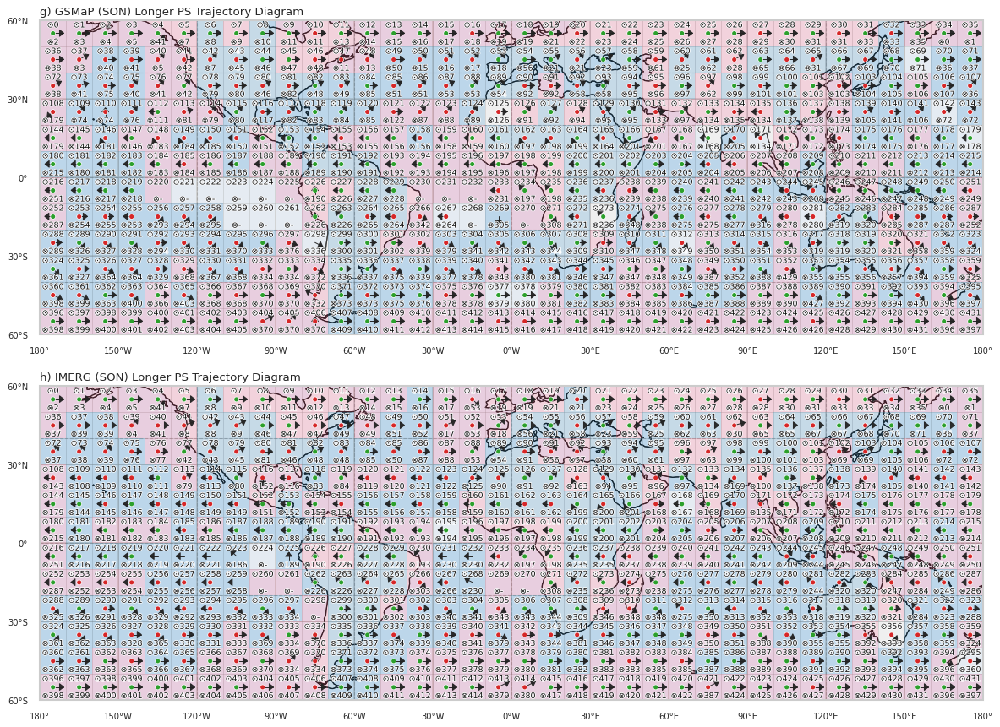

In [150]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_son,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[0],
    figsize=(14, 12)
)
plots.trajectory_map(
    imerg_summary_son,
    extent=(-180,180,-60,60),
    step=10,
    mode="full",
    show_counts=False,
    annotate_empty=True,
    draw_arrows=True,
    draw_self_dest_dot=False,
    arrow_len_frac=0.75,    # controla o comprimento fixo
    q_fontsize=8.5,
    d_fontsize=8.5,
    q_top_pad_frac=0.2,    # texto superior mais centralizado
    d_bot_pad_frac=0.15,    # texto inferior mais centralizado
    ax=axes[1],
    figsize=(14, 12)
)
axes[0].set_title("g) GSMaP (SON) Longer PS Trajectory Diagram", loc='left', fontsize=12)
axes[1].set_title("h) IMERG (SON) Longer PS Trajectory Diagram", loc='left', fontsize=12)

Text(0.0, 1.0, 'b) IMERG (DJF) Trajectory Diagram - Event Counter')

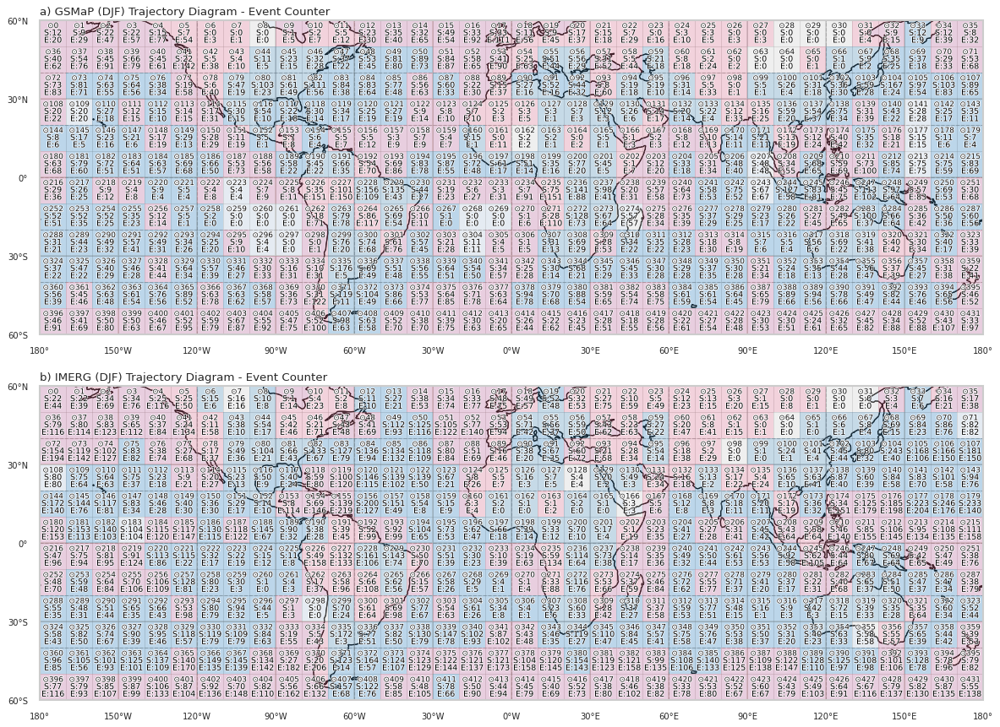

In [152]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_djf,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[0],
    figsize=(14, 12),
    q_fontsize=8
)

plots.trajectory_map(
    imerg_summary_djf,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[1],
    figsize=(14, 12),
    q_fontsize=8
)
# Add titles
axes[0].set_title("a) GSMaP (DJF) Trajectory Diagram - Event Counter", loc='left', fontsize=12)
axes[1].set_title("b) IMERG (DJF) Trajectory Diagram - Event Counter", loc='left', fontsize=12)

Text(0.0, 1.0, 'd) IMERG (MAM) Trajectory Diagram - Event Counter')

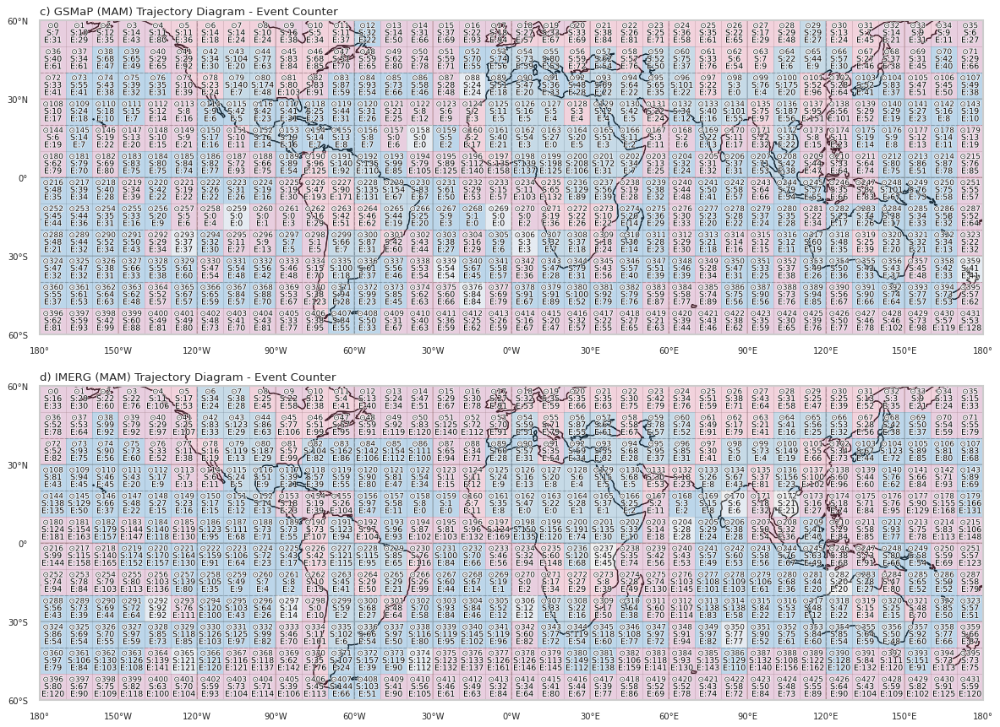

In [153]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_mam,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[0],
    figsize=(14, 12),
    q_fontsize=8
)

plots.trajectory_map(
    imerg_summary_mam,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[1],
    figsize=(14, 12),
    q_fontsize=8
)
axes[0].set_title("c) GSMaP (MAM) Trajectory Diagram - Event Counter", loc='left', fontsize=12)
axes[1].set_title("d) IMERG (MAM) Trajectory Diagram - Event Counter", loc='left', fontsize=12)

Text(0.0, 1.0, 'f) IMERG (JJA) Trajectory Diagram - Event Counter')

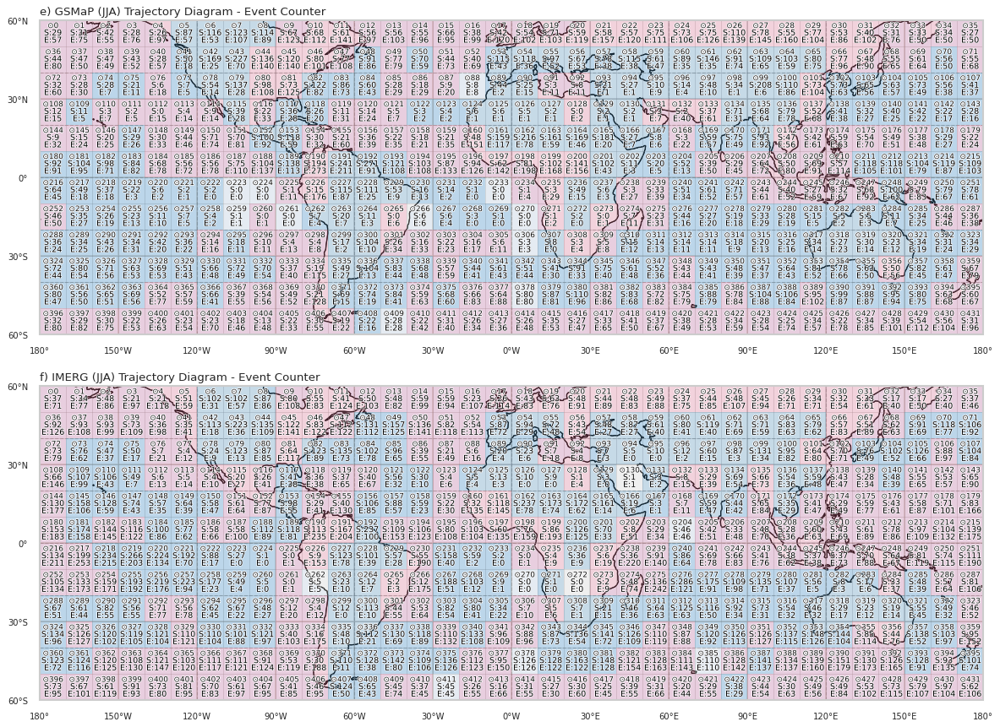

In [154]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})

plots.trajectory_map(
    gsmap_summary_jja,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[0],
    figsize=(14, 12),
    q_fontsize=8
)

plots.trajectory_map(
    imerg_summary_jja,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[1],
    figsize=(14, 12),
    q_fontsize=8
)

# Add titles
axes[0].set_title("e) GSMaP (JJA) Trajectory Diagram - Event Counter", loc='left', fontsize=12)
axes[1].set_title("f) IMERG (JJA) Trajectory Diagram - Event Counter", loc='left', fontsize=12)

Text(0.0, 1.0, 'h) IMERG (SON) Longer PS Trajectory Diagram')

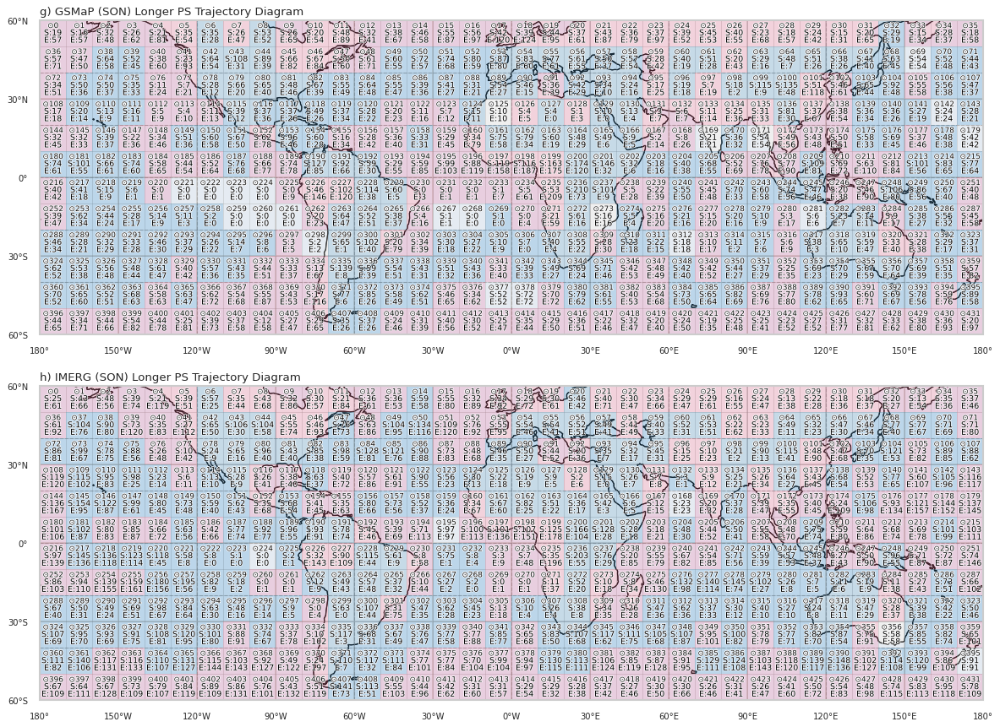

In [155]:
fig, axes = plt.subplots(2, 1, figsize=(18, 14), dpi=80, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.01, 'wspace': 0.13})
plots.trajectory_map(
    gsmap_summary_son,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[0],
    figsize=(14, 12),
    q_fontsize=8
)
plots.trajectory_map(
    imerg_summary_son,
    extent=(-180,180,-60,60),
    step=10,
    mode="balance",
    show_quad_id=True,
    show_counts=True,
    annotate_empty=True,
    draw_arrows=False,
    draw_self_dest_dot=False,
    arrow_len_frac=0.85,    # controla o comprimento fixo
    balance_top_frac=0.5,    # texto superior mais centralizado
    balance_mid_offset_frac=0.28,  # deslocamento médio para contagens S/E
    ax=axes[1],
    figsize=(14, 12),
    q_fontsize=8
)
axes[0].set_title("g) GSMaP (SON) Longer PS Trajectory Diagram", loc='left', fontsize=12)
axes[1].set_title("h) IMERG (SON) Longer PS Trajectory Diagram", loc='left', fontsize=12)

<GeoAxes: >

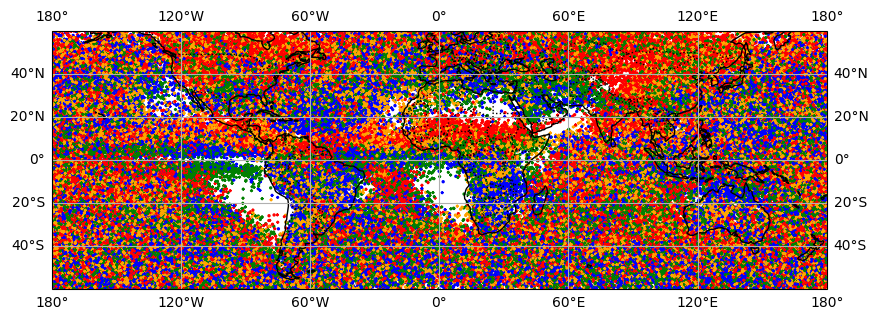

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw={'projection': cartopy.crs.PlateCarree()})
ax.set_global()
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True)
ax.set_extent([-180, 180, -60, 60], crs=cartopy.crs.PlateCarree())

seasonal_colors = {
    'DJF': 'blue',
    'MAM': 'green',
    'JJA': 'red',
    'SON': 'orange'
}

gsmap_larger_longer_df['start_geometry'].plot(ax=ax, color=gsmap_larger_longer_df['seasonal_category'].map(seasonal_colors), markersize=2, label='GSMaP Start')
imerg_larger_longer_df['start_geometry'].plot(ax=ax, color=imerg_larger_longer_df['seasonal_category'].map(seasonal_colors), markersize=2, marker='x', label='IMERG Start')

In [15]:
gsmap_start_djf = gsmap_larger_longer_df[gsmap_larger_longer_df['seasonal_category'] == 'DJF']
gsmap_end_dff = gsmap_larger_longer_df[gsmap_larger_longer_df['seasonal_category'] == 'DJF']

<GeoAxes: >

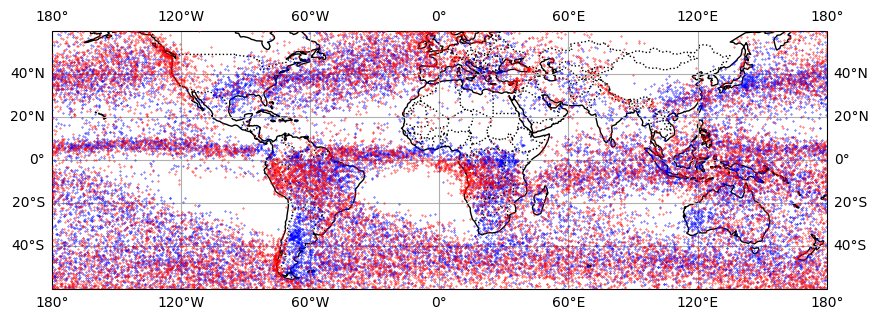

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw={'projection': cartopy.crs.PlateCarree()})
ax.set_global()
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True)
ax.set_extent([-180, 180, -60, 60], crs=cartopy.crs.PlateCarree())

# Color based on column seasonal_category
seasonal_colors = {
    'DJF': 'black',
    'MAM': 'gray',
    'JJA': 'gray',
    'SON': 'gray'
}
# gsmap_larger_longer_df['trajectory'].plot(
#     ax=ax,
#     color=gsmap_larger_longer_df['seasonal_category'].map(seasonal_colors),
#     linewidth=0.5,
#     label='Trajectory',
#     alpha=0.3,
#     zorder=4
# )

gsmap_start_djf['start_geometry'].plot(
    ax=ax,
    color='blue',
    markersize=0.1,
    label='Start Point',
    zorder=5
)

gsmap_end_dff['end_geometry'].plot(
    ax=ax,
    color='red',
    markersize=0.1,
    label='End Point',
    zorder=5
)

In [20]:
# Gsmap
gsmap_u_correction = gsmap_ds_v8['clu-u_'].sum(dim='time', skipna=True) / gsmap_ds_v8['clu-density'].sum(dim='time', skipna=True)
gsmap_v_correction = gsmap_ds_v8['clu-v_'].sum(dim='time', skipna=True) / gsmap_ds_v8['clu-density'].sum(dim='time', skipna=True)

# Imerg
imerg_u_correction = imerg_ds_v7['clu-u_'].sum(dim='time', skipna=True) / imerg_ds_v7['clu-density'].sum(dim='time', skipna=True)
imerg_v_correction = imerg_ds_v7['clu-v_'].sum(dim='time', skipna=True) / imerg_ds_v7['clu-density'].sum(dim='time', skipna=True)

In [21]:
# Compute
gsmap_u_correction = gsmap_u_correction.compute()
gsmap_v_correction = gsmap_v_correction.compute()
imerg_u_correction = imerg_u_correction.compute()
imerg_v_correction = imerg_v_correction.compute()

[########################################] | 100% Completed | 4.30 sms
[########################################] | 100% Completed | 4.28 s
[########################################] | 100% Completed | 3.79 sms
[########################################] | 100% Completed | 3.79 s
[########################################] | 100% Completed | 4.79 sms
[########################################] | 100% Completed | 4.89 s
[########################################] | 100% Completed | 4.40 sms
[########################################] | 100% Completed | 4.42 s


In [23]:
# Calculate the wind difference in m/s
pixel_size_km = 111.32
time_delta = 60
# Convert from pixel per time step to m/s
u_gsmap = gsmap_u_correction * (pixel_size_km * 1000 / (time_delta * 60))
v_gsmap = gsmap_v_correction * (pixel_size_km * 1000 / (time_delta * 60))
time_delta = 30 
# Convert from pixel per time step to m/s
u_imerg = imerg_u_correction * (pixel_size_km * 1000 / (time_delta * 60))
v_imerg = imerg_v_correction * (pixel_size_km * 1000 / (time_delta * 60))
# Calculate the magnitude of the wind correction
gsmap_magnitude_correction = np.sqrt(u_gsmap**2 + v_gsmap**2)
imerg_magnitude_correction = np.sqrt(u_imerg**2 + v_imerg**2)
# Difference between magnitude
magnitude_difference = imerg_magnitude_correction - gsmap_magnitude_correction

In [24]:
# Calculate angle difference
theta_gsmap = np.arctan2(v_gsmap, u_gsmap)
theta_imerg = np.arctan2(v_imerg, u_imerg)
angle_diff = theta_imerg - theta_gsmap
angle_diff = (angle_diff + np.pi) % (2 * np.pi) - np.pi
angle_diff_deg = np.degrees(angle_diff)

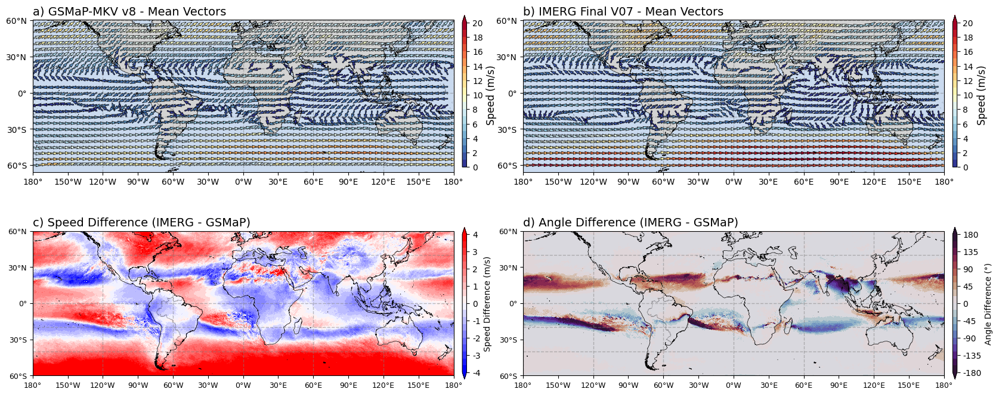

In [25]:
fig, axes = plt.subplots(2, 2, figsize=(20, 8), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()},
                                                          gridspec_kw={'hspace': 0.3, 'wspace': 0.13})
plots.quiver(gsmap_u_correction, gsmap_v_correction, sparsity=50, title='', ax=axes[0,0],
        cbar_label='Speed (m/s)', cmap='RdYlBu_r', cmap_num=20, 
        cbar_extend='max', cbar_fraction=0.01, ylim=[-60, 60], 
        time_delta=60, scale=0.7, figsize=(12, 8), alpha=0.5, 
        grid_alpha=0.5, max_speed=20, cbar_ticks=np.arange(0, 51, 2),
        cbar_orientation='vertical', cbar_pad=0.02, cbar_aspect=35, 
        cbar_shrink=1, cbar_format='%.0f', vel_unit='m/s', norm_comp=True, fix_norm=5)

plots.quiver(imerg_u_correction, imerg_v_correction, sparsity=50, title='', ax=axes[0,1],
        cbar_label='Speed (m/s)', cmap='RdYlBu_r', cmap_num=20, 
        cbar_extend='max', cbar_fraction=0.01, ylim=[-60, 60], 
        time_delta=30, scale=0.7, figsize=(12, 8), alpha=0.5, 
        grid_alpha=0.5, max_speed=20, cbar_ticks=np.arange(0, 51, 2),
        cbar_orientation='vertical', cbar_pad=0.02, cbar_aspect=35, 
        cbar_shrink=1, cbar_format='%.0f', vel_unit='m/s', norm_comp=True, fix_norm=5)

plots.map(magnitude_difference, figsize=(12, 8), ax=axes[1,0], title='', ylim=[-60, 60], cmap_num=20, cmap='bwr',
          cbar_fraction=0.01, cbar_aspect=35, cbar_pad=0.02, cbar_shrink=1, max_val=4, min_val=-4, cbar_extend='both', cbar_format='%.0f',cbar_label='Speed Difference (m/s)')
plots.map(angle_diff_deg, figsize=(12, 18), ax=axes[1,1], title='', ylim=[-60, 60], cmap_num=20, cmap='twilight_shifted', cbar_ticks=np.arange(-180, 181, 45),
          cbar_fraction=0.01, cbar_aspect=35, cbar_pad=0.02, cbar_shrink=1, max_val=180, min_val=-180, cbar_extend='both', cbar_format='%.0f',cbar_label='Angle Difference (°)')

axes[0,0].set_title(f'a) {gsmap_name} - Mean Vectors', loc='left', fontsize=14)
axes[0,1].set_title(f'b) {imerg_name} - Mean Vectors', loc='left', fontsize=14)
axes[1,0].set_title(f'c) Speed Difference (IMERG - GSMaP)', loc='left', fontsize=14)
axes[1,1].set_title(f'd) Angle Difference (IMERG - GSMaP)', loc='left', fontsize=14);

In [34]:
# Create GeoDataFrame for Tropical and Extratropical regions
tropics_geom = box(-180, -23.5, 180, 23.5)
extratropics_geom = box(-180, -90, 180, -23.5).union(box(-180, 23.5, 180, 90))
tropics_gdf = gpd.GeoDataFrame({'region': ['Tropics'], 'geometry': [tropics_geom]}, crs='EPSG:4326')
extratropic_gdf = gpd.GeoDataFrame({'region': ['Extratropics'], 'geometry': [extratropics_geom]}, crs='EPSG:4326')

# Create ocean and land masks using cartopy
land_50m = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m')
ocean_50m = cartopy.feature.NaturalEarthFeature('physical', 'ocean', '50m')
land_geom = gpd.GeoDataFrame(geometry=list(land_50m.geometries()), crs='EPSG:4326')
ocean_geom = gpd.GeoDataFrame(geometry=list(ocean_50m.geometries()), crs='EPSG:4326')

In [43]:
import xarray as xr

In [58]:
import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def wind_boxplots(
    gsmap_da: xr.DataArray,
    imerg_da: xr.DataArray,
    *,
    bins=None,
    include_lowest=True,
    order_south_to_north=True,
    showfliers=False,
    figsize=(16, 6.5),
    title="",
    ylabel=r"Speed (m s$^{-1}$)",
    ylim=None,                 # e.g. (0, 10)
    dpi=300,
    palette=("#0072B2", "#D55E00"),  # colorblind-safe
    median_marker=True,
    median_marker_size=28,
):

    # 1) Bins e rótulos
    if bins is None:
        bins = np.arange(-90, 91, 10)
    labels = [f"{bins[i]}–{bins[i+1]}" for i in range(len(bins) - 1)]
    cat_order = labels if order_south_to_north else labels[::-1]

    # 2) Converter DA -> DataFrame com bin de latitude
    def _to_df(da: xr.DataArray, name: str) -> pd.DataFrame:
        df = da.to_dataframe(name="value").reset_index()
        df["lat_bin"] = pd.cut(df["lat"], bins=bins, labels=labels, include_lowest=include_lowest)
        df["dataset"] = name
        return df[["lat_bin", "dataset", "value"]].dropna(subset=["lat_bin", "value"])

    df_g = _to_df(gsmap_da, "GSMaP")
    df_i = _to_df(imerg_da, "IMERG")
    df = pd.concat([df_g, df_i], ignore_index=True)
    df["lat_bin"] = pd.Categorical(df["lat_bin"], categories=cat_order, ordered=True)

    # 3) Estilo e figura
    sns.set_theme(context="talk", style="whitegrid")
    plt.figure(figsize=figsize)
    ax = sns.boxplot(
        data=df,
        x="lat_bin",
        y="value",
        hue="dataset",
        showfliers=showfliers,
        width=0.72,
        linewidth=1.1,
        dodge=True,
        palette=list(palette),
    )

    # 4) Eixos e rótulos
    ax.set_xlabel("Latitude bands (°)", labelpad=8)
    ax.set_ylabel(ylabel, labelpad=8)
    ax.set_title(title, pad=10)
    if ylim is not None:
        ax.set_ylim(*ylim)

    # Formatação do eixo y com UMA casa decimal
    ax.yaxis.set_major_formatter(FuncFormatter(lambda v, _: f"{v:.1f}"))

    # Grade suave e despine
    ax.grid(axis="y", linestyle="--", alpha=0.35)
    sns.despine(offset=5, trim=True)

    # Rotação dos rótulos do eixo x
    ax.set_xticklabels(ax.get_xticklabels())

    # 5) Mediana destacada por marcador (opcional)
    if median_marker:
        med = (
            df.groupby(["lat_bin", "dataset"])["value"]
              .median()
              .unstack("dataset")
        )
        xticks = np.arange(len(cat_order))
        offset = 0.20
        for i, lab in enumerate(cat_order):
            if lab in med.index:
                if "GSMaP" in med.columns and pd.notna(med.loc[lab, "GSMaP"]):
                    ax.scatter(
                        i - offset, med.loc[lab, "GSMaP"],
                        marker="D", s=median_marker_size, zorder=3,
                        edgecolor="k", linewidth=0.6, facecolor=palette[0]
                    )
                if "IMERG" in med.columns and pd.notna(med.loc[lab, "IMERG"]):
                    ax.scatter(
                        i + offset, med.loc[lab, "IMERG"],
                        marker="D", s=median_marker_size, zorder=3,
                        edgecolor="k", linewidth=0.6, facecolor=palette[1]
                    )
    # 6) Legenda à direita, centralizada verticalmente
    ax.legend(
        title="",
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        borderaxespad=0,
        frameon=False
    )

    # Change yticks font size
    plt.yticks(fontsize=14)
    # Change xticks font size
    plt.xticks(fontsize=14)
    # Change ylabel font size
    ax.yaxis.label.set_size(16)
    # Change xlabel font size
    ax.xaxis.label.set_size(16)

    plt.tight_layout()

    plt.show()


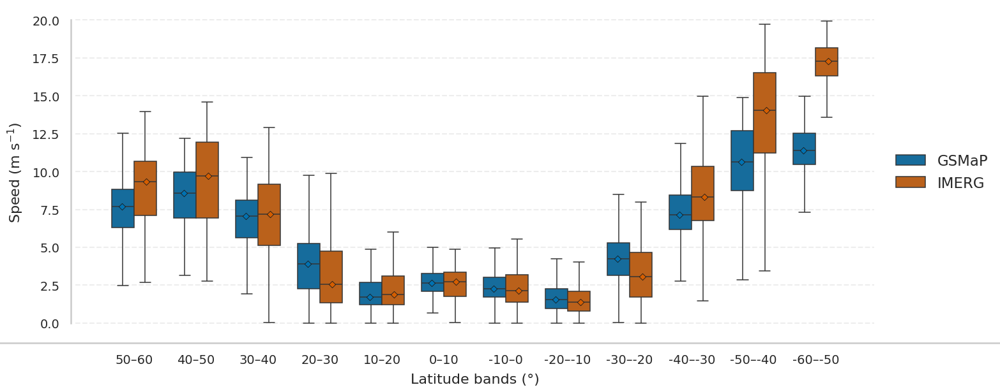

In [62]:
wind_boxplots(
    gsmap_magnitude_correction,
    imerg_magnitude_correction,
    showfliers=False,
    order_south_to_north=False,
    palette=("#0072B2", "#D55E00")
)